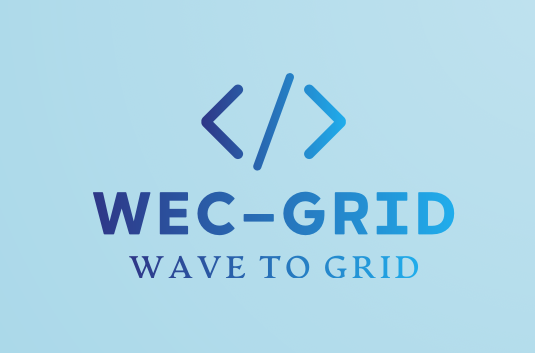

<hr style="height:4px;border-width:0;color:black;background-color:black">

<h2><center>FES2023 Demonstration</center></h2>

<p style="line-height:1.5">
    <span style="font-family: Times">
    <span style="font-size:16pt">
WEC-Grid is a software platform that is being developed to enable grid operators to integrate wave energy converters (WECs) onto their grids easily. The primary focus of the platform is currently on microgrids, but it has been designed with scalability in mind. Our goal is to create an open-source tool that simplifies the integration of WECs and eliminates many of the challenges associated with setting up an SQL database and coordinating models operating at different temporal resolutions. By abstracting away much of the setup and backend work, we hope for operators and researchers to incorporate WECs into their systems. The code below is a demonstration of the software current abilities
</span> 
</span>
</p>

<hr style="height:4px;border-width:0;color:black;background-color:black">

<h2><center>Enviroment</center></h2>

<p style="line-height:1.5">
    <span style="font-family: Times">
    <span style="font-size:16pt">
Currently, our project uses Jupyter Notebooks and Anaconda to interact with and manage WEC-Grid. These platforms are widely supported by both publishers and the community. In particular, Jupyter Notebook greatly simplifies the process of interacting with WEC-Grid. Its live cell format enables quick analysis and running of smaller scripts, making it a highly efficient tool for our needs.
</span> 
</span>
</p>

<hr style="height:4px;border-width:0;color:black;background-color:black">

<h2><center>Initalization of a WEC-Grid</center></h2>`

<p style="line-height:1.5">
    <span style="font-family: Times">
    <span style="font-size:16pt">

</span> 
</span>
</p>

<p style="line-height:1.5">
    <span style="font-family: Times">
    <span style="font-size:16pt">
The cell below is the "Import" cell. In this cell we import all the needed packages and in particular the WEC-Grid package. This simple import initalizes the PSSe connection for us.
</span> 
</span>
</p>

In [1]:
import os, sys
sys.path.append('../wec-grid-code') # add to Python Path
import wec_grid_class as wg # import our program
import sqlite3 as sql
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, HTML
display(HTML("<style>.container { width:70% !important; }</style>"))

    Sets PSSE environment to latest minor version among installed versions of PSSE 35.
    Use psse35.set_minor(n) to set PSSE35 minor version (n) to use.
        Example, for PSSE 35.0.x, use this as: psse35.set_minor(0)


In [2]:
case24 = r"../input_files/RTS96DYN/IEEE_24_bus.RAW" # IEEE RTS 96 - 24 bus case

In [3]:
WecObj = wg.Wec_grid(case24) # initialize Object.. reads file ... finds a steady state
WecObj.initalize_psse("fnsl")


 Input error detected at !
 -m ipykernel_launcher --ip=127.0.0.1 --stdin=9021 --control=9019 --hb=9018 "--Session.signature_scheme=\"hmac-sha256\"" "--Session.key=b\"ca217a97-5ce3-4bef-ad7a-dfdc16ccde5e\"" --shell=9020 "--transport=\"tcp\"" --iopu
                                                                                                          !

 PSS(R)E Xplore Version 35
 Copyright (c) 1976-2023
 Siemens Industry, Inc.,
 Power Technologies International                            (PTI)
 This program is a confidential  unpublished  work  created  and  first
 licensed in 1976.  It is a trade secret which is the property of  PTI.
 All use,  disclosure,  and/or reproduction not specifically authorized
 by  PTI  is prohibited.   This  program is protected  under  copyright
 laws  of  non-U.S.  countries  and  by  application  of  international
 treaties.  All  Rights  Reserved  Under  The  Copyright  Laws.

 Could not find entry point runpy_add_to_sys_path

           SIEMENS POW

In [4]:
WecObj.psse_dataframe # lets take a look at the data

,BUS_ID,Bus,BASE,PU,ANGLED,Type,P Gen,Q Gen,P Load,Q Load,P,Q
0,1,BUS 1,138.0,1.000000,0.000000,3,35.930069,180.488586,NaN,NaN,35.930069,180.488586
1,2,BUS 2,138.0,0.997822,0.010373,2,67.000000,0.000000,97.0,20.000000,-30.000000,-20.000000
2,3,BUS 3,138.0,0.863703,10.755864,1,NaN,NaN,90.0,19.000000,-90.000000,-19.000000
3,4,BUS 4,138.0,0.887014,-0.415208,1,NaN,NaN,74.0,15.000001,-74.000000,-15.000001
4,5,BUS 5,138.0,0.927217,-0.229420,1,NaN,NaN,71.0,14.000000,-71.000000,-14.000000
5,6,BUS 6,138.0,0.907952,0.391817,1,NaN,NaN,68.0,14.000000,-68.000000,-14.000000
6,7,BUS 7,138.0,0.796234,-0.580059,2,64.000000,0.000000,62.0,13.000000,2.000000,-13.000000
7,8,BUS 8,230.0,0.805368,-0.868408,1,NaN,NaN,85.0,18.000000,-85.000000,-18.000000
8,9,BUS 9,138.0,0.834940,4.989085,1,NaN,NaN,175.0,36.000000,-175.000000,-36.000000
9,10,BUS 10,138.0,0.881702,3.723669,1,NaN,NaN,100.0,23.000000,-100.000000,-23.000000


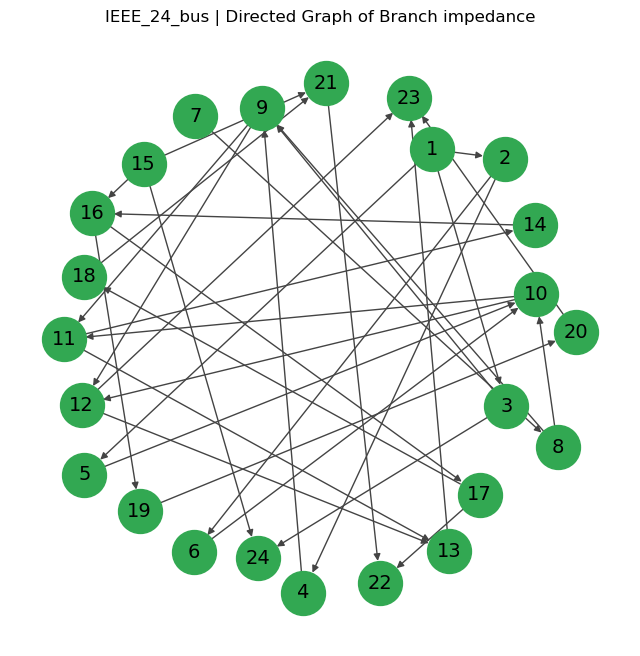

In [60]:
WecObj._psse_viz() # function call

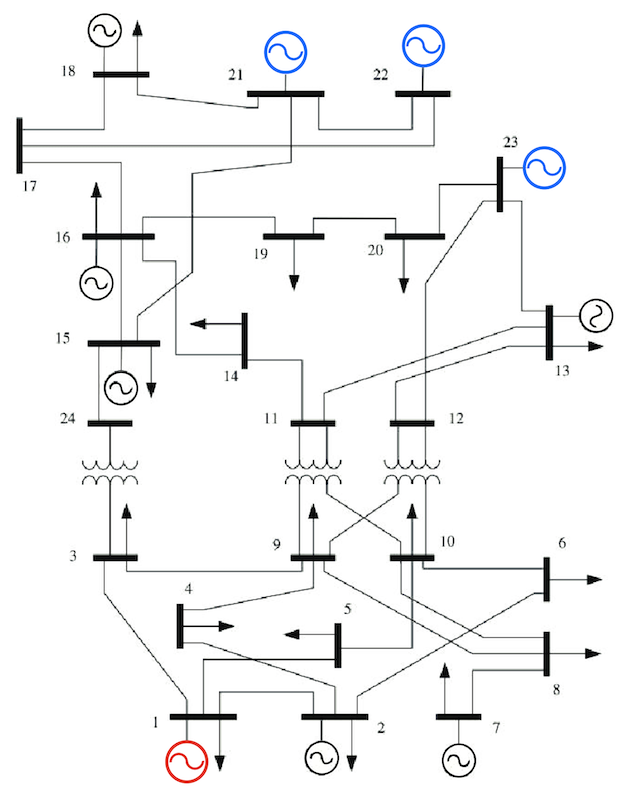

<hr style="height:4px;border-width:0;color:black;background-color:black">

<h2><center>WEC-Sim </center></h2>

<p style="line-height:1.5">
    <span style="font-family: Times">
    <span style="font-size:16pt">
For this demonstration well be using a modified RM3 with WEC-PTO to extract electrical output. To the right we can see an example of the RM3 from WEC-SIM. x3 speed.
</span> 
</span>
</p>

<p style="line-height:1.5">
    <span style="font-family: Times">
    <span style="font-size:16pt">
WEC-Grid has a function call which connects to MATLAB via a Python engine to run the WEC models. This API call is much more efficent and abstracts away the WEC-Sim steps. below is an example. We can pass the usual simulation variables such as Wave height and Wave period. Once the simulation is compelte we call a MATLAB scripts to process and populate the SQLite database. Here's an example of the WEC-Sim run call.
</span> 
</span>
</p>

```python 
    WecObj.run_WEC_Sim(wec_id = id, 
                   sim_length = (24*60*60), # 6 hours 
                   Tsample = 300, # 5 mins 
                   waveHeight = 2.5, 
                   wavePeriod = 8, 
                   waveSeed = np.random.randint(999999999)
                  )

```


<hr style="height:4px;border-width:0;color:black;background-color:black">

<h2><center>WEC Output / SQLite Database</center></h2>

    
<p style="line-height:1.5">
<span style="font-family: Times">
<span style="font-size:16pt">
For this demostration we'll be focusing on AC injection. The Values which will be updated are the Activate Power (P) and Voltage Magitude in PU (V). So we can go ahead and pull that data from the SQL database.
</span> 
</span>
</p>

In [61]:
WecObj.wec_list = [21, 22, 23]
WecObj.pull_wec_data()
WecObj.wec_data[21]

,time,ibus,pg,vs,pt,pb,qt,qb
0,0.0,1.0,0.000000,1.0,0.000000,0.0,0.000000,0.000000
1,450.0,1.0,23.256423,1.1,23.256423,0.0,55.194093,-55.194093
2,750.0,1.0,15.977173,1.1,15.977173,0.0,57.805537,-57.805537
3,1050.0,1.0,17.944307,1.1,17.944307,0.0,57.224866,-57.224866
4,1350.0,1.0,18.016432,1.1,18.016432,0.0,57.203177,-57.203177
5,1650.0,1.0,14.775629,1.1,14.775629,0.0,58.128816,-58.128816
6,1950.0,1.0,18.737864,1.1,18.737864,0.0,56.991535,-56.991535
7,2250.0,1.0,15.875397,1.1,15.875397,0.0,57.837028,-57.837028
8,2550.0,1.0,11.432392,1.1,11.432392,0.0,58.878389,-58.878389
9,2850.0,1.0,17.745890,1.1,17.745890,0.0,57.277790,-57.277790


<hr style="height:4px;border-width:0;color:black;background-color:black">

<h2><center> WEC Intergration </center></h2>

<p style="line-height:1.5">
<span style="font-family: Times">
<span style="font-size:16pt">
From the WEC output, we grab the P, V, and time stamp to preform our steady state intergration. In like 2 & 3 of the cell below we packages the values in bus order and call the python ac_injection() function in line 4. it's able to complete the entire 6 hour or 288 very quickly
</span> 
</span>
</p>

In [62]:
for i in range(len(WecObj.wec_data[21])):
    WecObj._psse_ac_injection(start=0,end=(60*60*4))
    print("========================")


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    294.000         0.00000      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.911253         1.00000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         4.6851(     21     )   11.5706(     21     )
                                                             0.35612(     13     )   0.77630(     21     )
   1         1.6998(     21     )    2.0024(     18     )
                                                             0.12671(     24     )   0.21414(     21     )
   2         0.2849(     16     )    0.2095(     15     )
                                                             0.05753(      7     )   0.06332(     21     )
   3         0.0440(     16     )    0.0150(     16     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.6578         16.4753      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3235(     22     )    1.3932(     21     )
                                                             0.09091(     22     )   0.00681(     22     )
   1         0.0254(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00527(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.3163         20.4134      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919045         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8381(     23     )   22.3644(     23     )
                                                             0.43314(     20     )   0.11011(      8     )
   1         1.5097(     20     )    9.3962(     20     )
                                                             0.22473(     20     )   0.06157(      8     )
   2         0.3646(     20     )    1.6350(     20     )
                                                             0.08847(     20     )   0.03807(      8     )
   3         0.0512(     20     )    0.1309(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.7082         16.3326      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3365(     22     )    1.3937(     21     )
                                                             0.09091(     22     )   0.00459(     22     )
   1         0.0265(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00529(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919654         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8300(     23     )   22.2890(     23     )
                                                             0.42687(     20     )   0.10735(      8     )
   1         1.4743(     20     )    9.1944(     20     )
                                                             0.22311(     20     )   0.06031(      8     )
   2         0.3552(     20     )    1.5917(     20     )
                                                             0.08686(     20     )   0.03704(      8     )
   3         0.0491(     20     )    0.1253(     20     )
                                                             0.01082(     20     )   0.00666(      8     )
   4         0.0010(     16     )    0.0013(     20     )
                                         


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.8576         15.4133      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918919         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8846(     23     )   22.3799(     23     )
                                                             0.43217(     20     )   0.10653(      8     )
   1         1.5008(     20     )    9.3748(     20     )
                                                             0.22492(     20     )   0.06133(      8     )
   2         0.3627(     20     )    1.6324(     20     )
                                                             0.08873(     20     )   0.03831(      8     )
   3         0.0511(     20     )    0.1310(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.2041         14.2218      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919269         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9190(     23     )   22.3366(     23     )
                                                             0.42707(     20     )   0.10274(      8     )
   1         1.4674(     20     )    9.2175(     20     )
                                                             0.22393(     20     )   0.06077(      8     )
   2         0.3544(     20     )    1.6000(     20     )
                                                             0.08781(     20     )   0.03806(      8     )
   3         0.0496(     20     )    0.1272(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.7351         21.1828      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919010         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8240(     23     )   22.3687(     23     )
                                                             0.43407(     20     )   0.11116(      8     )
   1         1.5167(     20     )    9.4237(     20     )
                                                             0.22485(     20     )   0.06161(      8     )
   2         0.3663(     20     )    1.6404(     20     )
                                                             0.08857(     20     )   0.03802(      8     )
   3         0.0514(     20     )    0.1314(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.0980         25.7417      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918324         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.7697(     23     )   22.4535(     23     )
                                                             0.44429(     20     )   0.11933(      8     )
   1         1.5815(     20     )    9.7430(     20     )
                                                             0.22687(     20     )   0.06345(      8     )
   2         0.3827(     20     )    1.7066(     20     )
                                                             0.09052(     20     )   0.03901(      8     )
   3         0.0545(     20     )    0.1394(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.4343         16.2028      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3458(     22     )    1.3941(     21     )
                                                             0.09091(     22     )   0.00301(     22     )
   1         0.0272(     22     )    0.0000(     21     )
                                                             0.00067(      7     )   0.00531(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8245(     23     )   22.3040(     23     )
                                                             0.42868(     20     )   0.10913(      8     )
   1         1.4845(     20     )    9.2502(     20     )
                                                             0.22349(     20     )   0.06092(      8     )
   2         0.3579(     20     )    1.6033(     20     )
                                                             0.08724(     20     )   0.03740(      8     )
   3         0.0497(     20     )    0.1267(     20     )
                                                             0.01093(     20     )   0.00676(      8     )
   4         0.0011(     20     )    0.0013(     20     )
                                                             0.00016(      7     )   0.00014(      8     )
   5         0.0000(     20     )    0.0000(     20     )


 Reached tol


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    12.0462         14.1735      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3068(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00925(     22     )
   1         0.0242(     22     )    0.0001(     21     )
                                                             0.00074(      7     )   0.00524(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.1573         19.7135      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920150         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8734(     23     )   22.2277(     23     )
                                                             0.41995(     20     )   0.10235(      8     )
   1         1.4298(     20     )    8.9826(     20     )
                                                             0.22170(     20     )   0.05949(      8     )
   2         0.3441(     20     )    1.5482(     20     )
                                                             0.08555(     20     )   0.03660(      8     )
   3         0.0472(     20     )    0.1202(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.9640         18.8408      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956942         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6163(     21     )   20.5168(     21     )
                                                             0.10809(     15     )   0.04343(     22     )
   1         0.1581(     18     )    1.1845(     18     )
                                                             0.08818(     15     )   0.03564(     22     )
   2         0.0258(     16     )    0.0942(     18     )
                                                             0.01015(     15     )   0.00782(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.0777         0.00000      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.914463         1.00000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         1.4102(     23     )    9.6106(     23     )
                                                             0.06503(     20     )   0.00951(     23     )
   1         0.0613(     20     )    0.4945(     20     )
                                                             0.06172(     20     )   0.01672(      8     )
   2         0.0100(     20     )    0.0286(     20     )
                                                             0.00500(     20     )   0.00258(      8     )
   3         0.0001(     16     )    0.0001(     20     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.3419         14.1699      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918878         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9155(     23     )   22.3850(     23     )
                                                             0.43143(     20     )   0.10498(      8     )
   1         1.4930(     20     )    9.3564(     20     )
                                                             0.22499(     20     )   0.06154(      8     )
   2         0.3611(     20     )    1.6296(     20     )
                                                             0.08885(     20     )   0.03866(      8     )
   3         0.0510(     20     )    0.1310(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.5353         17.1428      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957335         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6556(     21     )   20.4604(     21     )
                                                             0.10670(     15     )   0.03611(     22     )
   1         0.1526(     18     )    1.1661(     18     )
                                                             0.08757(     15     )   0.03474(     22     )
   2         0.0252(     16     )    0.0922(     18     )
                                                             0.01000(     15     )   0.00762(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.0573         17.5231      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957600         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6185(     21     )   20.4223(     21     )
                                                             0.10637(     15     )   0.03954(     22     )
   1         0.1538(     18     )    1.1599(     18     )
                                                             0.08715(     15     )   0.03422(     22     )
   2         0.0250(     16     )    0.0913(     18     )
                                                             0.00987(     15     )   0.00741(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.4133         19.1026      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919173         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8383(     23     )   22.3485(     23     )
                                                             0.43159(     20     )   0.10893(      8     )
   1         1.5013(     20     )    9.3470(     20     )
                                                             0.22437(     20     )   0.06113(      8     )
   2         0.3624(     20     )    1.6246(     20     )
                                                             0.08812(     20     )   0.03777(      8     )
   3         0.0507(     20     )    0.1296(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.1877         15.3747      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956884         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6316(     21     )   20.5251(     21     )
                                                             0.10804(     15     )   0.04145(     22     )
   1         0.1571(     18     )    1.1845(     18     )
                                                             0.08827(     15     )   0.03599(     22     )
   2         0.0258(     16     )    0.0943(     18     )
                                                             0.01019(     15     )   0.00795(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.0479         16.1891      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956780         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6122(     21     )   20.5400(     21     )
                                                             0.10845(     15     )   0.04404(     22     )
   1         0.1592(     18     )    1.1900(     18     )
                                                             0.08840(     15     )   0.03581(     22     )
   2         0.0259(     16     )    0.0949(     18     )
                                                             0.01021(     15     )   0.00788(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3189(     22     )    1.3936(     21     )
                                                             0.09091(     22     )   0.00780(     22     )
   1         0.0249(     22     )    0.0001(     21     )
                                                             0.00069(      7     )   0.00523(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismatch:     -0.00 MW      0.00 Mvar      0.00 MVA at bus 13 [13          230.00]
 System total absolute mismatch:                    0.00 MVA

 SWING BUS SUM


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.1530         21.4729      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919965         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8109(     23     )   22.2506(     23     )
                                                             0.42433(     20     )   0.10692(      8     )
   1         1.4617(     20     )    9.1104(     20     )
                                                             0.22232(     20     )   0.05967(      8     )
   2         0.3517(     20     )    1.5732(     20     )
                                                             0.08606(     20     )   0.03642(      8     )
   3         0.0483(     20     )    0.1228(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.9629         19.3019      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3206(     22     )    1.3927(     21     )
                                                             0.09091(     22     )   0.00777(     22     )
   1         0.0249(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00525(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.9797         18.7344      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956930         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5833(     21     )   20.5184(     21     )
                                                             0.10840(     15     )   0.04753(     22     )
   1         0.1607(     18     )    1.1879(     18     )
                                                             0.08819(     15     )   0.03562(     22     )
   2         0.0258(     16     )    0.0945(     18     )
                                                             0.01014(     15     )   0.00776(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.0175         19.0510      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3457(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00351(     22     )
   1         0.0270(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00531(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2902(     22     )    1.3932(     21     )
                                                             0.09091(     22     )   0.01293(     22     )
   1         0.0224(     22     )    0.0002(     21     )
                                                             0.00074(      7     )   0.00516(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismatch:     -0.00 MW      0.00 Mvar      0.00 MVA at bus 6 [6           138.00]
 System total absolute mismatch:                    0.00 MVA

 SWING BUS SUMM


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.2067         21.8156      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2872(     22     )    1.3952(     21     )
                                                             0.09091(     22     )   0.01367(     22     )
   1         0.0220(     22     )    0.0001(     21     )
                                                             0.00068(      7     )   0.00509(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.3163         20.4134      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919045         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8381(     23     )   22.3644(     23     )
                                                             0.43314(     20     )   0.11011(      8     )
   1         1.5097(     20     )    9.3962(     20     )
                                                             0.22473(     20     )   0.06157(      8     )
   2         0.3646(     20     )    1.6350(     20     )
                                                             0.08847(     20     )   0.03807(      8     )
   3         0.0512(     20     )    0.1309(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.2759         22.1402      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919533         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8245(     23     )   22.3040(     23     )
                                                             0.42868(     20     )   0.10913(      8     )
   1         1.4845(     20     )    9.2502(     20     )
                                                             0.22349(     20     )   0.06092(      8     )
   2         0.3579(     20     )    1.6033(     20     )
                                                             0.08724(     20     )   0.03740(      8     )
   3         0.0497(     20     )    0.1267(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.1000         15.9797      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956802         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6375(     21     )   20.5368(     21     )
                                                             0.10820(     15     )   0.04121(     22     )
   1         0.1572(     18     )    1.1871(     18     )
                                                             0.08840(     15     )   0.03615(     22     )
   2         0.0259(     16     )    0.0946(     18     )
                                                             0.01023(     15     )   0.00800(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.7135         17.0773      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920078         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8956(     23     )   22.2366(     23     )
                                                             0.41968(     20     )   0.10081(      8     )
   1         1.4267(     20     )    8.9785(     20     )
                                                             0.22185(     20     )   0.05947(      8     )
   2         0.3435(     20     )    1.5482(     20     )
                                                             0.08572(     20     )   0.03678(      8     )
   3         0.0472(     20     )    0.1204(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.1267         15.4403      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3060(     22     )    1.3940(     21     )
                                                             0.09091(     22     )   0.00955(     22     )
   1         0.0240(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00521(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    23.2564         15.9772      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957122         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6909(     21     )   20.4909(     21     )
                                                             0.10686(     15     )   0.03302(      8     )
   1         0.1510(     18     )    1.1699(     18     )
                                                             0.08789(     15     )   0.03470(     22     )
   2         0.0254(     16     )    0.0928(     18     )
                                                             0.01009(     15     )   0.00770(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.9307         17.6016      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2933(     22     )    1.3933(     21     )
                                                             0.09091(     22     )   0.01208(     22     )
   1         0.0228(     22     )    0.0002(     21     )
                                                             0.00074(      7     )   0.00518(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.9408         17.4748      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920634         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8854(     23     )   22.1679(     23     )
                                                             0.41433(     20     )   0.09864(      8     )
   1         1.3975(     20     )    8.8083(     20     )
                                                             0.22039(     20     )   0.05838(      8     )
   2         0.3358(     20     )    1.5117(     20     )
                                                             0.08430(     20     )   0.03586(      8     )
   3         0.0455(     20     )    0.1158(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.0573         17.5231      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957600         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6185(     21     )   20.4223(     21     )
                                                             0.10637(     15     )   0.03954(     22     )
   1         0.1538(     18     )    1.1599(     18     )
                                                             0.08715(     15     )   0.03422(     22     )
   2         0.0250(     16     )    0.0913(     18     )
                                                             0.00987(     15     )   0.00741(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.3883         18.5883      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3434(     22     )    1.3935(     21     )
                                                             0.09091(     22     )   0.00381(     22     )
   1         0.0269(     22     )    0.0000(     21     )
                                                             0.00067(      7     )   0.00530(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.0505         14.9562      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3320(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00513(     22     )
   1         0.0262(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00530(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.9775         18.9342      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3465(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00337(     22     )
   1         0.0271(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00532(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.1551         16.6686      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919850         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8967(     23     )   22.2648(     23     )
                                                             0.42199(     20     )   0.10175(      8     )
   1         1.4399(     20     )    9.0516(     20     )
                                                             0.22244(     20     )   0.05985(      8     )
   2         0.3470(     20     )    1.5638(     20     )
                                                             0.08631(     20     )   0.03711(      8     )
   3         0.0479(     20     )    0.1224(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.2028         20.1762      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2925(     22     )    1.3933(     21     )
                                                             0.09091(     22     )   0.01262(     22     )
   1         0.0225(     22     )    0.0001(     21     )
                                                             0.00073(      7     )   0.00516(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.2528         17.9629      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3372(     22     )    1.3925(     21     )
                                                             0.09091(     22     )   0.00477(     22     )
   1         0.0264(     22     )    0.0000(     21     )
                                                             0.00071(      7     )   0.00531(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.5733         17.7118      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919112         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8671(     23     )   22.3560(     23     )
                                                             0.43101(     20     )   0.10729(      8     )
   1         1.4951(     20     )    9.3339(     20     )
                                                             0.22446(     20     )   0.06120(      8     )
   2         0.3611(     20     )    1.6229(     20     )
                                                             0.08825(     20     )   0.03803(      8     )
   3         0.0506(     20     )    0.1296(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.8105         16.1478      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956984         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6407(     21     )   20.5107(     21     )
                                                             0.10770(     15     )   0.03979(     22     )
   1         0.1558(     18     )    1.1800(     18     )
                                                             0.08811(     15     )   0.03565(     22     )
   2         0.0257(     16     )    0.0938(     18     )
                                                             0.01015(     15     )   0.00787(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.1267         15.4403      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3060(     22     )    1.3940(     21     )
                                                             0.09091(     22     )   0.00955(     22     )
   1         0.0240(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00521(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    23.2564         15.9772      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957122         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6909(     21     )   20.4909(     21     )
                                                             0.10686(     15     )   0.03302(      8     )
   1         0.1510(     18     )    1.1699(     18     )
                                                             0.08789(     15     )   0.03470(     22     )
   2         0.0254(     16     )    0.0928(     18     )
                                                             0.01009(     15     )   0.00770(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.5022         16.4559      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957277         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6057(     21     )   20.4687(     21     )
                                                             0.10729(     15     )   0.04289(     22     )
   1         0.1567(     18     )    1.1728(     18     )
                                                             0.08766(     15     )   0.03516(     22     )
   2         0.0254(     16     )    0.0928(     18     )
                                                             0.01001(     15     )   0.00765(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.5831         20.2908      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957739         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6173(     21     )   20.4024(     21     )
                                                             0.10618(     15     )   0.04055(     22     )
   1         0.1536(     18     )    1.1567(     18     )
                                                             0.08701(     15     )   0.03477(     22     )
   2         0.0249(     16     )    0.0909(     18     )
                                                             0.00984(     15     )   0.00752(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.8285         16.5733      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918210         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8600(     23     )   22.4675(     23     )
                                                             0.44119(     20     )   0.11226(      8     )
   1         1.5559(     20     )    9.6606(     20     )
                                                             0.22691(     20     )   0.06295(      8     )
   2         0.3769(     20     )    1.6926(     20     )
                                                             0.09070(     20     )   0.03942(      8     )
   3         0.0539(     20     )    0.1386(     20     )
                                                     


  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3524(     22     )    1.3943(     21     )
                                                             0.09091(     22     )   0.00178(     22     )
   1         0.0279(     22     )    0.0000(     21     )
                                                             0.00066(      7     )   0.00533(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismatch:     -0.00 MW     -0.00 Mvar      0.00 MVA at bus 6 [6           138.00]
 System total absolute mismatch:                    0.00 MVA

 SWING BUS SUMMARY:
   BUS#-SCT X-- NAME --X BASKV      PGEN     PMAX    PMIN      QGEN     QMAX    QMIN
      1     1           138.00     618.6   1000.


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.1267         15.4403      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3060(     22     )    1.3940(     21     )
                                                             0.09091(     22     )   0.00955(     22     )
   1         0.0240(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00521(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    0.00000         14.0980      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.915326         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.7645(     23     )   22.8239(     23     )
                                                             0.47865(     20     )   0.13224(      8     )
   1         1.7998(     20     )   10.8872(     20     )
                                                             0.23495(     20     )   0.06821(      8     )
   2         0.4397(     20     )    1.9541(     20     )
                                                             0.09895(     20     )   0.04326(      8     )
   3         0.0668(     20     )    0.1729(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    11.4324         17.7459      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.955951         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5587(     21     )   20.6589(     21     )
                                                             0.11125(     15     )   0.05592(     22     )
   1         0.1690(     18     )    1.2280(     18     )
                                                             0.08975(     15     )   0.03805(     22     )
   2         0.0271(     16     )    0.0992(     18     )
                                                             0.01058(     15     )   0.00844(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.9408         17.4748      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920634         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8854(     23     )   22.1679(     23     )
                                                             0.41433(     20     )   0.09864(      8     )
   1         1.3975(     20     )    8.8083(     20     )
                                                             0.22039(     20     )   0.05838(      8     )
   2         0.3358(     20     )    1.5117(     20     )
                                                             0.08430(     20     )   0.03586(      8     )
   3         0.0455(     20     )    0.1158(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.6022         20.5946      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919654         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8300(     23     )   22.2890(     23     )
                                                             0.42687(     20     )   0.10735(      8     )
   1         1.4743(     20     )    9.1944(     20     )
                                                             0.22311(     20     )   0.06031(      8     )
   2         0.3552(     20     )    1.5917(     20     )
                                                             0.08686(     20     )   0.03704(      8     )
   3         0.0491(     20     )    0.1253(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.9971         18.4172      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956619         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5808(     21     )   20.5630(     21     )
                                                             0.10918(     15     )   0.04894(     22     )
   1         0.1627(     18     )    1.1992(     18     )
                                                             0.08865(     15     )   0.03593(     22     )
   2         0.0262(     16     )    0.0958(     18     )
                                                             0.01027(     15     )   0.00787(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.0505         14.9562      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3320(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00513(     22     )
   1         0.0262(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00530(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    11.5608         16.5025      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.917686         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8419(     23     )   22.5323(     23     )
                                                             0.44769(     20     )   0.11578(      8     )
   1         1.5971(     20     )    9.8693(     20     )
                                                             0.22834(     20     )   0.06381(      8     )
   2         0.3875(     20     )    1.7367(     20     )
                                                             0.09212(     20     )   0.04004(      8     )
   3         0.0560(     20     )    0.1442(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.4753         17.8394      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3189(     22     )    1.3936(     21     )
                                                             0.09091(     22     )   0.00780(     22     )
   1         0.0249(     22     )    0.0001(     21     )
                                                             0.00069(      7     )   0.00523(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.8498         16.4755      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957936         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6434(     21     )   20.3741(     21     )
                                                             0.10529(     15     )   0.03429(     22     )
   1         0.1498(     18     )    1.1455(     18     )
                                                             0.08663(     15     )   0.03329(     22     )
   2         0.0245(     16     )    0.0897(     18     )
                                                             0.00973(     15     )   0.00719(     22     )
   3         0.0007(     16     )    0.0008(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.9629         19.3019      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3206(     22     )    1.3927(     21     )
                                                             0.09091(     22     )   0.00777(     22     )
   1         0.0249(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00525(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.7118         16.8334      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919624         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8813(     23     )   22.2927(     23     )
                                                             0.42495(     20     )   0.10373(      8     )
   1         1.4587(     20     )    9.1431(     20     )
                                                             0.22307(     20     )   0.06022(      8     )
   2         0.3517(     20     )    1.5827(     20     )
                                                             0.08690(     20     )   0.03733(      8     )
   3         0.0488(     20     )    0.1246(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.0510         15.0505      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3751(     22     )    1.3936(     21     )
                                                             0.09091(     22     )   0.00207(     22     )
   1         0.0298(     22     )    0.0000(     18     )
                                                             0.00067(      7     )   0.00542(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.7738         15.7085      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957398         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6026(     21     )   20.4512(     21     )
                                                             0.10697(     15     )   0.04230(     22     )
   1         0.1561(     18     )    1.1683(     18     )
                                                             0.08745(     15     )   0.03473(     22     )
   2         0.0252(     16     )    0.0923(     18     )
                                                             0.00995(     15     )   0.00753(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.9443         18.0164      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957438         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6037(     21     )   20.4455(     21     )
                                                             0.10687(     15     )   0.04178(     22     )
   1         0.1558(     18     )    1.1667(     18     )
                                                             0.08738(     15     )   0.03416(     22     )
   2         0.0251(     16     )    0.0921(     18     )
                                                             0.00992(     15     )   0.00738(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.4343         16.2028      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3458(     22     )    1.3941(     21     )
                                                             0.09091(     22     )   0.00301(     22     )
   1         0.0272(     22     )    0.0000(     21     )
                                                             0.00067(      7     )   0.00531(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.2759         22.1402      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919533         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8245(     23     )   22.3040(     23     )
                                                             0.42868(     20     )   0.10913(      8     )
   1         1.4845(     20     )    9.2502(     20     )
                                                             0.22349(     20     )   0.06092(      8     )
   2         0.3579(     20     )    1.6033(     20     )
                                                             0.08724(     20     )   0.03740(      8     )
   3         0.0497(     20     )    0.1267(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.0536         18.1000      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.955964         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5851(     21     )   20.6569(     21     )
                                                             0.11097(     15     )   0.05266(     22     )
   1         0.1669(     18     )    1.2248(     18     )
                                                             0.08973(     15     )   0.03806(     22     )
   2         0.0271(     16     )    0.0989(     18     )
                                                             0.01058(     15     )   0.00849(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.7199         17.2587      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3824(     22     )    1.3941(     21     )
                                                             0.09091(     22     )   0.00290(     22     )
   1         0.0302(     22     )    0.0000(     17     )
                                                             0.00065(      7     )   0.00542(     22     )
   2         0.0000(      2     )    0.0000(     21     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.0193         15.9478      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3658(     22     )    1.3942(     21     )
                                                             0.09091(     22     )   0.00036(     22     )
   1         0.0289(     22     )    0.0000(     16     )
                                                             0.00066(      7     )   0.00537(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.8839         14.4286      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3685(     22     )    1.3934(     21     )
                                                             0.09091(     22     )   0.00107(     22     )
   1         0.0293(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00541(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.8394         14.0529      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3718(     22     )    1.3935(     21     )
                                                             0.09091(     22     )   0.00168(     22     )
   1         0.0296(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00542(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.5707         21.5353      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956973         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5268(     21     )   20.5122(     21     )
                                                             0.10891(     15     )   0.05531(     22     )
   1         0.1652(     18     )    1.1929(     18     )
                                                             0.08816(     15     )   0.03588(     22     )
   2         0.0259(     16     )    0.0948(     18     )
                                                             0.01012(     15     )   0.00772(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.2233         19.0573      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956570         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5664(     21     )   20.5700(     21     )
                                                             0.10952(     15     )   0.05169(     22     )
   1         0.1644(     18     )    1.2033(     18     )
                                                             0.08876(     15     )   0.03649(     22     )
   2         0.0263(     16     )    0.0962(     18     )
                                                             0.01030(     15     )   0.00799(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6530(     21     )   20.5335(     21     )
                                                             0.10796(     15     )   0.03866(     22     )
   1         0.1557(     18     )    1.1843(     18     )
                                                             0.08835(     15     )   0.03585(     22     )
   2         0.0258(     16     )    0.0944(     18     )
                                                             0.01021(     15     )   0.00796(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                             0.00016(      7     )   0.00015(     22     )
   4         0.0000(     16     )    0.0000(     18     )


 Reached tolerance in 4 iterations

 Largest mismatch:     -0.00 MW     -0.00 Mvar      0.00 MVA at bus 16 [16          230.00]
 System total absolute mismatch:                 


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.2218         17.6120      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918280         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8532(     23     )   22.4588(     23     )
                                                             0.44075(     20     )   0.11254(      8     )
   1         1.5537(     20     )    9.6449(     20     )
                                                             0.22674(     20     )   0.06288(      8     )
   2         0.3762(     20     )    1.6889(     20     )
                                                             0.09052(     20     )   0.03929(      8     )
   3         0.0537(     20     )    0.1380(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    11.5608         16.5025      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.917686         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8419(     23     )   22.5323(     23     )
                                                             0.44769(     20     )   0.11578(      8     )
   1         1.5971(     20     )    9.8693(     20     )
                                                             0.22834(     20     )   0.06381(      8     )
   2         0.3875(     20     )    1.7367(     20     )
                                                             0.09212(     20     )   0.04004(      8     )
   3         0.0560(     20     )    0.1442(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.8394         14.0529      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3718(     22     )    1.3935(     21     )
                                                             0.09091(     22     )   0.00168(     22     )
   1         0.0296(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00542(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.4755         13.5707      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956761         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6437(     21     )   20.5427(     21     )
                                                             0.10816(     15     )   0.03975(     22     )
   1         0.1567(     18     )    1.1870(     18     )
                                                             0.08843(     15     )   0.03588(     22     )
   2         0.0259(     16     )    0.0947(     18     )
                                                             0.01023(     15     )   0.00796(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.6510         16.6022      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918467         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8775(     23     )   22.4358(     23     )
                                                             0.43757(     20     )   0.10981(      8     )
   1         1.5326(     20     )    9.5469(     20     )
                                                             0.22617(     20     )   0.06241(      8     )
   2         0.3710(     20     )    1.6688(     20     )
                                                             0.08997(     20     )   0.03909(      8     )
   3         0.0528(     20     )    0.1356(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.5173         19.3883      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2929(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.01245(     22     )
   1         0.0226(     22     )    0.0002(     21     )
                                                             0.00074(      7     )   0.00517(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.1653         17.1877      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956371         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6111(     21     )   20.5986(     21     )
                                                             0.10956(     15     )   0.04663(     22     )
   1         0.1620(     18     )    1.2058(     18     )
                                                             0.08906(     15     )   0.03680(     22     )
   2         0.0265(     16     )    0.0967(     18     )
                                                             0.01040(     15     )   0.00817(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918674         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9078(     23     )   22.4102(     23     )
                                                             0.43359(     20     )   0.10534(      8     )
   1         1.5079(     20     )    9.4253(     20     )
                                                             0.22550(     20     )   0.06145(      8     )
   2         0.3648(     20     )    1.6442(     20     )
                                                             0.08935(     20     )   0.03867(      8     )
   3         0.0517(     20     )    0.1328(     20     )
                                                             0.01158(     20     )   0.00725(      8     )
   4         0.0012(     16     )    0.0015(     20     )
                                         


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.1551         16.6686      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919850         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8967(     23     )   22.2648(     23     )
                                                             0.42199(     20     )   0.10175(      8     )
   1         1.4399(     20     )    9.0516(     20     )
                                                             0.22244(     20     )   0.05985(      8     )
   2         0.3470(     20     )    1.5638(     20     )
                                                             0.08631(     20     )   0.03711(      8     )
   3         0.0479(     20     )    0.1224(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.4559         18.3529      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956448         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6013(     21     )   20.5875(     21     )
                                                             0.10947(     15     )   0.04751(     22     )
   1         0.1623(     18     )    1.2040(     18     )
                                                             0.08893(     15     )   0.03651(     22     )
   2         0.0264(     16     )    0.0965(     18     )
                                                             0.01036(     15     )   0.00807(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.5831         20.2908      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957739         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6173(     21     )   20.4024(     21     )
                                                             0.10618(     15     )   0.04055(     22     )
   1         0.1536(     18     )    1.1567(     18     )
                                                             0.08701(     15     )   0.03477(     22     )
   2         0.0249(     16     )    0.0909(     18     )
                                                             0.00984(     15     )   0.00752(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.8285         16.5733      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918210         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8600(     23     )   22.4675(     23     )
                                                             0.44119(     20     )   0.11226(      8     )
   1         1.5559(     20     )    9.6606(     20     )
                                                             0.22691(     20     )   0.06295(      8     )
   2         0.3769(     20     )    1.6926(     20     )
                                                             0.09070(     20     )   0.03942(      8     )
   3         0.0539(     20     )    0.1386(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.7135         17.0773      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920078         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8956(     23     )   22.2366(     23     )
                                                             0.41968(     20     )   0.10081(      8     )
   1         1.4267(     20     )    8.9785(     20     )
                                                             0.22185(     20     )   0.05947(      8     )
   2         0.3435(     20     )    1.5482(     20     )
                                                             0.08572(     20     )   0.03678(      8     )
   3         0.0472(     20     )    0.1204(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.3706         15.7351      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919562         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8892(     23     )   22.3004(     23     )
                                                             0.42524(     20     )   0.10333(      8     )
   1         1.4598(     20     )    9.1537(     20     )
                                                             0.22322(     20     )   0.06027(      8     )
   2         0.3521(     20     )    1.5853(     20     )
                                                             0.08706(     20     )   0.03744(      8     )
   3         0.0489(     20     )    0.1251(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    23.2564         15.9772      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957122         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6909(     21     )   20.4909(     21     )
                                                             0.10686(     15     )   0.03302(      8     )
   1         0.1510(     18     )    1.1699(     18     )
                                                             0.08789(     15     )   0.03470(     22     )
   2         0.0254(     16     )    0.0928(     18     )
                                                             0.01009(     15     )   0.00770(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.7459         16.5022      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956897         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6265(     21     )   20.5231(     21     )
                                                             0.10803(     15     )   0.04169(     22     )
   1         0.1574(     18     )    1.1843(     18     )
                                                             0.08822(     15     )   0.03553(     22     )
   2         0.0258(     16     )    0.0943(     18     )
                                                             0.01017(     15     )   0.00782(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.7082         16.3326      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3365(     22     )    1.3937(     21     )
                                                             0.09091(     22     )   0.00459(     22     )
   1         0.0265(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00529(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.5946         17.4574      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920407         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8971(     23     )   22.1960(     23     )
                                                             0.41619(     20     )   0.09907(      8     )
   1         1.4067(     20     )    8.8688(     20     )
                                                             0.22096(     20     )   0.05881(      8     )
   2         0.3383(     20     )    1.5249(     20     )
                                                             0.08486(     20     )   0.03626(      8     )
   3         0.0461(     20     )    0.1175(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.4133         19.1026      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919173         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8383(     23     )   22.3485(     23     )
                                                             0.43159(     20     )   0.10893(      8     )
   1         1.5013(     20     )    9.3470(     20     )
                                                             0.22437(     20     )   0.06113(      8     )
   2         0.3624(     20     )    1.6246(     20     )
                                                             0.08812(     20     )   0.03777(      8     )
   3         0.0507(     20     )    0.1296(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.9562         19.0193      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2904(     22     )    1.3934(     21     )
                                                             0.09091(     22     )   0.01279(     22     )
   1         0.0225(     22     )    0.0002(     21     )
                                                             0.00074(      7     )   0.00516(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.8839         14.4286      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3685(     22     )    1.3934(     21     )
                                                             0.09091(     22     )   0.00107(     22     )
   1         0.0293(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00541(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.8394         14.0529      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3718(     22     )    1.3935(     21     )
                                                             0.09091(     22     )   0.00168(     22     )
   1         0.0296(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00542(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.4755         13.5707      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956761         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6437(     21     )   20.5427(     21     )
                                                             0.10816(     15     )   0.03975(     22     )
   1         0.1567(     18     )    1.1870(     18     )
                                                             0.08843(     15     )   0.03588(     22     )
   2         0.0259(     16     )    0.0947(     18     )
                                                             0.01023(     15     )   0.00796(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.6510         16.6022      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918467         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8775(     23     )   22.4358(     23     )
                                                             0.43757(     20     )   0.10981(      8     )
   1         1.5326(     20     )    9.5469(     20     )
                                                             0.22617(     20     )   0.06241(      8     )
   2         0.3710(     20     )    1.6688(     20     )
                                                             0.08997(     20     )   0.03909(      8     )
   3         0.0528(     20     )    0.1356(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.5173         19.3883      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2929(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.01245(     22     )
   1         0.0226(     22     )    0.0002(     21     )
                                                             0.00074(      7     )   0.00517(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.1653         17.1877      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956371         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6111(     21     )   20.5986(     21     )
                                                             0.10956(     15     )   0.04663(     22     )
   1         0.1620(     18     )    1.2058(     18     )
                                                             0.08906(     15     )   0.03680(     22     )
   2         0.0265(     16     )    0.0967(     18     )
                                                             0.01040(     15     )   0.00817(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.9775         18.9342      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3465(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00337(     22     )
   1         0.0271(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00532(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.0164         14.7756      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956876         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6472(     21     )   20.5262(     21     )
                                                             0.10788(     15     )   0.03917(     22     )
   1         0.1558(     18     )    1.1830(     18     )
                                                             0.08827(     15     )   0.03582(     22     )
   2         0.0258(     16     )    0.0942(     18     )
                                                             0.01019(     15     )   0.00793(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.1762         21.2911      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3251(     22     )    1.3939(     21     )
                                                             0.09091(     22     )   0.00730(     22     )
   1         0.0251(     22     )    0.0000(     21     )
                                                             0.00066(      7     )   0.00522(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.9629         19.3019      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3206(     22     )    1.3927(     21     )
                                                             0.09091(     22     )   0.00777(     22     )
   1         0.0249(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00525(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.7344         18.6279      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956995         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6148(     21     )   20.5092(     21     )
                                                             0.10796(     15     )   0.04329(     22     )
   1         0.1579(     18     )    1.1826(     18     )
                                                             0.08809(     15     )   0.03552(     22     )
   2         0.0257(     16     )    0.0940(     18     )
                                                             0.01013(     15     )   0.00778(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.0758         16.1653      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957043         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6080(     21     )   20.5022(     21     )
                                                             0.10782(     15     )   0.04325(     22     )
   1         0.1579(     18     )    1.1806(     18     )
                                                             0.08799(     15     )   0.03527(     22     )
   2         0.0256(     16     )    0.0937(     18     )
                                                             0.01010(     15     )   0.00771(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.5743         19.9775      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3316(     22     )    1.3941(     21     )
                                                             0.09091(     22     )   0.00600(     22     )
   1         0.0258(     22     )    0.0000(     21     )
                                                             0.00067(      7     )   0.00524(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.2067         21.8156      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2872(     22     )    1.3952(     21     )
                                                             0.09091(     22     )   0.01367(     22     )
   1         0.0220(     22     )    0.0001(     21     )
                                                             0.00068(      7     )   0.00509(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919045         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8381(     23     )   22.3644(     23     )
                                                             0.43314(     20     )   0.11011(      8     )
   1         1.5097(     20     )    9.3962(     20     )
                                                             0.22473(     20     )   0.06157(      8     )
   2         0.3646(     20     )    1.6350(     20     )
                                                             0.08847(     20     )   0.03807(      8     )
   3         0.0512(     20     )    0.1309(     20     )
                                                             0.01128(     20     )   0.00700(      8     )
   4         0.0011(     20     )    0.0014(     20     )
                                         


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.1428         21.5831      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956903         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5686(     21     )   20.5224(     21     )
                                                             0.10870(     15     )   0.05025(     22     )
   1         0.1623(     18     )    1.1913(     18     )
                                                             0.08826(     15     )   0.03585(     22     )
   2         0.0259(     16     )    0.0948(     18     )
                                                             0.01016(     15     )   0.00779(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.5231         14.0536      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957029         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6460(     21     )   20.5042(     21     )
                                                             0.10747(     15     )   0.03819(     22     )
   1         0.1549(     18     )    1.1771(     18     )
                                                             0.08802(     15     )   0.03531(     22     )
   2         0.0256(     16     )    0.0935(     18     )
                                                             0.01012(     15     )   0.00779(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.1026         20.1573      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920634         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8486(     23     )   22.1679(     23     )
                                                             0.41581(     20     )   0.10114(      8     )
   1         1.4093(     20     )    8.8482(     20     )
                                                             0.22045(     20     )   0.05837(      8     )
   2         0.3384(     20     )    1.5188(     20     )
                                                             0.08430(     20     )   0.03562(      8     )
   3         0.0458(     20     )    0.1163(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.3747         18.9640      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957075         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5713(     21     )   20.4976(     21     )
                                                             0.10814(     15     )   0.04835(     22     )
   1         0.1607(     18     )    1.1837(     18     )
                                                             0.08796(     15     )   0.03533(     22     )
   2         0.0257(     16     )    0.0939(     18     )
                                                             0.01008(     15     )   0.00766(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.5025         17.0777      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918727         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8787(     23     )   22.4036(     23     )
                                                             0.43478(     20     )   0.10867(      8     )
   1         1.5157(     20     )    9.4567(     20     )
                                                             0.22548(     20     )   0.06204(      8     )
   2         0.3666(     20     )    1.6495(     20     )
                                                             0.08929(     20     )   0.03876(      8     )
   3         0.0519(     20     )    0.1331(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.7379         15.8754      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957122         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6400(     21     )   20.4909(     21     )
                                                             0.10733(     15     )   0.03879(     22     )
   1         0.1549(     18     )    1.1747(     18     )
                                                             0.08788(     15     )   0.03509(     22     )
   2         0.0255(     16     )    0.0932(     18     )
                                                             0.01008(     15     )   0.00771(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.4729         16.3159      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920432         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9186(     23     )   22.1928(     23     )
                                                             0.41504(     20     )   0.09747(      8     )
   1         1.3982(     20     )    8.8363(     20     )
                                                             0.22085(     20     )   0.05874(      8     )
   2         0.3363(     20     )    1.5189(     20     )
                                                             0.08479(     20     )   0.03635(      8     )
   3         0.0459(     20     )    0.1170(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.7424         19.2462      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3078(     22     )    1.3938(     21     )
                                                             0.09091(     22     )   0.00988(     22     )
   1         0.0239(     22     )    0.0001(     21     )
                                                             0.00070(      7     )   0.00519(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.9971         18.4172      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956619         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5808(     21     )   20.5630(     21     )
                                                             0.10918(     15     )   0.04894(     22     )
   1         0.1627(     18     )    1.1992(     18     )
                                                             0.08865(     15     )   0.03593(     22     )
   2         0.0262(     16     )    0.0958(     18     )
                                                             0.01027(     15     )   0.00787(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.1877         15.3747      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956884         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6316(     21     )   20.5251(     21     )
                                                             0.10804(     15     )   0.04145(     22     )
   1         0.1571(     18     )    1.1845(     18     )
                                                             0.08827(     15     )   0.03599(     22     )
   2         0.0258(     16     )    0.0943(     18     )
                                                             0.01019(     15     )   0.00795(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.9342         17.8839      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3455(     22     )    1.3925(     21     )
                                                             0.09091(     22     )   0.00336(     22     )
   1         0.0271(     22     )    0.0000(     21     )
                                                             0.00070(      7     )   0.00533(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.7756         18.7379      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956498         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5773(     21     )   20.5804(     21     )
                                                             0.10959(     15     )   0.05055(     22     )
   1         0.1639(     18     )    1.2048(     18     )
                                                             0.08887(     15     )   0.03657(     22     )
   2         0.0264(     16     )    0.0965(     18     )
                                                             0.01033(     15     )   0.00804(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.1762         21.2911      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3251(     22     )    1.3939(     21     )
                                                             0.09091(     22     )   0.00730(     22     )
   1         0.0251(     22     )    0.0000(     21     )
                                                             0.00066(      7     )   0.00522(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.8872         14.2233      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956543         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6114(     21     )   20.5740(     21     )
                                                             0.10900(     15     )   0.04472(     22     )
   1         0.1605(     18     )    1.1981(     18     )
                                                             0.08875(     15     )   0.03610(     22     )
   2         0.0262(     16     )    0.0958(     18     )
                                                             0.01031(     15     )   0.00798(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.6279         14.9971      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956825         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6530(     21     )   20.5335(     21     )
                                                             0.10796(     15     )   0.03866(     22     )
   1         0.1557(     18     )    1.1843(     18     )
                                                             0.08835(     15     )   0.03585(     22     )
   2         0.0258(     16     )    0.0944(     18     )
                                                             0.01021(     15     )   0.00796(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.0510         15.0505      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3751(     22     )    1.3936(     21     )
                                                             0.09091(     22     )   0.00207(     22     )
   1         0.0298(     22     )    0.0000(     18     )
                                                             0.00067(      7     )   0.00542(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.9775         18.9342      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3465(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00337(     22     )
   1         0.0271(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00532(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.1551         16.6686      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919850         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8967(     23     )   22.2648(     23     )
                                                             0.42199(     20     )   0.10175(      8     )
   1         1.4399(     20     )    9.0516(     20     )
                                                             0.22244(     20     )   0.05985(      8     )
   2         0.3470(     20     )    1.5638(     20     )
                                                             0.08631(     20     )   0.03711(      8     )
   3         0.0479(     20     )    0.1224(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.4134         14.1717      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920043         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9336(     23     )   22.2409(     23     )
                                                             0.41832(     20     )   0.09797(      8     )
   1         1.4158(     20     )    8.9428(     20     )
                                                             0.22185(     20     )   0.05932(      8     )
   2         0.3411(     20     )    1.5421(     20     )
                                                             0.08578(     20     )   0.03695(      8     )
   3         0.0469(     20     )    0.1200(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.2759         22.1402      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919533         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8245(     23     )   22.3040(     23     )
                                                             0.42868(     20     )   0.10913(      8     )
   1         1.4845(     20     )    9.2502(     20     )
                                                             0.22349(     20     )   0.06092(      8     )
   2         0.3579(     20     )    1.6033(     20     )
                                                             0.08724(     20     )   0.03740(      8     )
   3         0.0497(     20     )    0.1267(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.0536         18.1000      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.955964         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5851(     21     )   20.6569(     21     )
                                                             0.11097(     15     )   0.05266(     22     )
   1         0.1669(     18     )    1.2248(     18     )
                                                             0.08973(     15     )   0.03806(     22     )
   2         0.0271(     16     )    0.0989(     18     )
                                                             0.01058(     15     )   0.00849(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.1573         19.7135      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920150         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8734(     23     )   22.2277(     23     )
                                                             0.41995(     20     )   0.10235(      8     )
   1         1.4298(     20     )    8.9826(     20     )
                                                             0.22170(     20     )   0.05949(      8     )
   2         0.3441(     20     )    1.5482(     20     )
                                                             0.08555(     20     )   0.03660(      8     )
   3         0.0472(     20     )    0.1202(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.9640         18.8408      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956942         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6163(     21     )   20.5168(     21     )
                                                             0.10809(     15     )   0.04343(     22     )
   1         0.1581(     18     )    1.1845(     18     )
                                                             0.08818(     15     )   0.03564(     22     )
   2         0.0258(     16     )    0.0942(     18     )
                                                             0.01015(     15     )   0.00782(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    0.00000         17.8033      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.1521(     21     )    1.3911(     21     )
                                                             0.09091(     22     )   0.03894(     22     )
   1         0.0117(     21     )    0.0015(     21     )
                                                             0.00122(      7     )   0.00506(     22     )
   2         0.0000(     21     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    11.4324         17.7459      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.955951         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5587(     21     )   20.6589(     21     )
                                                             0.11125(     15     )   0.05592(     22     )
   1         0.1690(     18     )    1.2280(     18     )
                                                             0.08975(     15     )   0.03805(     22     )
   2         0.0271(     16     )    0.0992(     18     )
                                                             0.01058(     15     )   0.00844(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.5707         21.5353      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956973         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5268(     21     )   20.5122(     21     )
                                                             0.10891(     15     )   0.05531(     22     )
   1         0.1652(     18     )    1.1929(     18     )
                                                             0.08816(     15     )   0.03588(     22     )
   2         0.0259(     16     )    0.0948(     18     )
                                                             0.01012(     15     )   0.00772(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.0573         17.5231      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957600         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6185(     21     )   20.4223(     21     )
                                                             0.10637(     15     )   0.03954(     22     )
   1         0.1538(     18     )    1.1599(     18     )
                                                             0.08715(     15     )   0.03422(     22     )
   2         0.0250(     16     )    0.0913(     18     )
                                                             0.00987(     15     )   0.00741(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.4133         19.1026      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919173         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8383(     23     )   22.3485(     23     )
                                                             0.43159(     20     )   0.10893(      8     )
   1         1.5013(     20     )    9.3470(     20     )
                                                             0.22437(     20     )   0.06113(      8     )
   2         0.3624(     20     )    1.6246(     20     )
                                                             0.08812(     20     )   0.03777(      8     )
   3         0.0507(     20     )    0.1296(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.9977         16.3963      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919963         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8957(     23     )   22.2508(     23     )
                                                             0.42081(     20     )   0.10113(      8     )
   1         1.4334(     20     )    9.0141(     20     )
                                                             0.22214(     20     )   0.05959(      8     )
   2         0.3453(     20     )    1.5558(     20     )
                                                             0.08601(     20     )   0.03690(      8     )
   3         0.0475(     20     )    0.1214(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    0.00000         23.2564      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.951678         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.4493(     21     )   21.2716(     21     )
                                                             0.12546(     15     )   0.09541(     22     )
   1         0.2101(     18     )    1.4296(     18     )
                                                             0.09703(     15     )   0.04832(     22     )
   2         0.0336(     16     )    0.1234(     18     )
                                                             0.01274(     15     )   0.01155(     22     )
   3         0.0013(     16     )    0.0015(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.0529         13.9307      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3313(     22     )    1.3922(     21     )
                                                             0.09091(     22     )   0.00511(     22     )
   1         0.0262(     22     )    0.0001(     21     )
                                                             0.00074(      7     )   0.00533(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.1332         17.8328      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3262(     22     )    1.3930(     21     )
                                                             0.09091(     22     )   0.00659(     22     )
   1         0.0255(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00527(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.2233         19.0573      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956570         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5664(     21     )   20.5700(     21     )
                                                             0.10952(     15     )   0.05169(     22     )
   1         0.1644(     18     )    1.2033(     18     )
                                                             0.08876(     15     )   0.03649(     22     )
   2         0.0263(     16     )    0.0962(     18     )
                                                             0.01030(     15     )   0.00799(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.5173         19.3883      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2929(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.01245(     22     )
   1         0.0226(     22     )    0.0002(     21     )
                                                             0.00074(      7     )   0.00517(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.0505         14.9562      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3320(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00513(     22     )
   1         0.0262(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00530(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.2495         11.5608      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918674         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9078(     23     )   22.4102(     23     )
                                                             0.43359(     20     )   0.10534(      8     )
   1         1.5079(     20     )    9.4253(     20     )
                                                             0.22550(     20     )   0.06145(      8     )
   2         0.3648(     20     )    1.6442(     20     )
                                                             0.08935(     20     )   0.03867(      8     )
   3         0.0517(     20     )    0.1328(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.1551         16.6686      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919850         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8967(     23     )   22.2648(     23     )
                                                             0.42199(     20     )   0.10175(      8     )
   1         1.4399(     20     )    9.0516(     20     )
                                                             0.22244(     20     )   0.05985(      8     )
   2         0.3470(     20     )    1.5638(     20     )
                                                             0.08631(     20     )   0.03711(      8     )
   3         0.0479(     20     )    0.1224(     20     )
                                                     


 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920043         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9336(     23     )   22.2409(     23     )
                                                             0.41832(     20     )   0.09797(      8     )
   1         1.4158(     20     )    8.9428(     20     )
                                                             0.22185(     20     )   0.05932(      8     )
   2         0.3411(     20     )    1.5421(     20     )
                                                             0.08578(     20     )   0.03695(      8     )
   3         0.0469(     20     )    0.1200(     20     )
                                                             0.01056(     20     )   0.00662(      8     )
   4         0.0010(     16     )    0.0012(     20     )
                                         


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.5831         20.2908      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957739         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6173(     21     )   20.4024(     21     )
                                                             0.10618(     15     )   0.04055(     22     )
   1         0.1536(     18     )    1.1567(     18     )
                                                             0.08701(     15     )   0.03477(     22     )
   2         0.0249(     16     )    0.0909(     18     )
                                                             0.00984(     15     )   0.00752(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.4574         13.8285      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918424         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9275(     23     )   22.4411(     23     )
                                                             0.43592(     20     )   0.10667(      8     )
   1         1.5177(     20     )    9.5028(     20     )
                                                             0.22619(     20     )   0.06248(      8     )
   2         0.3677(     20     )    1.6613(     20     )
                                                             0.09008(     20     )   0.03949(      8     )
   3         0.0525(     20     )    0.1352(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.7199         17.2587      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3824(     22     )    1.3941(     21     )
                                                             0.09091(     22     )   0.00290(     22     )
   1         0.0302(     22     )    0.0000(     17     )
                                                             0.00065(      7     )   0.00542(     22     )
   2         0.0000(      2     )    0.0000(     21     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.9977         16.3963      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919963         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8957(     23     )   22.2508(     23     )
                                                             0.42081(     20     )   0.10113(      8     )
   1         1.4334(     20     )    9.0141(     20     )
                                                             0.22214(     20     )   0.05959(      8     )
   2         0.3453(     20     )    1.5558(     20     )
                                                             0.08601(     20     )   0.03690(      8     )
   3         0.0475(     20     )    0.1214(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.4286         0.00000      PG

 No power flow data changed for bus 22 [22          230.00]

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.1443(     22     )    0.0000(     21     )
                                                             0.00390(      7     )   0.02745(     22     )
   1         0.0002(      2     )    0.0004(      3     )
                                                             0.00019(      7     )   0.00017(     22     )
   2         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 2 iterations

 Largest mismatch:      0.00 MW      0.00 Mvar      0.00 MVA at bus 9 [9           138.00]
 System total absolute mismatch:                    0.00 MVA

 SWING BUS SUMMARY:
   BUS#-SCT X-- NAME --X BASKV      PGEN     PMAX    PMIN      QGEN     QMAX    QMIN


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.8754         11.4324      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956287         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6668(     21     )   20.6106(     21     )
                                                             0.10911(     15     )   0.03902(     22     )
   1         0.1577(     18     )    1.2018(     18     )
                                                             0.08917(     15     )   0.03703(     22     )
   2         0.0265(     16     )    0.0966(     18     )
                                                             0.01045(     15     )   0.00835(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.5707         21.5353      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956973         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5268(     21     )   20.5122(     21     )
                                                             0.10891(     15     )   0.05531(     22     )
   1         0.1652(     18     )    1.1929(     18     )
                                                             0.08816(     15     )   0.03588(     22     )
   2         0.0259(     16     )    0.0948(     18     )
                                                             0.01012(     15     )   0.00772(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.7424         19.2462      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3078(     22     )    1.3938(     21     )
                                                             0.09091(     22     )   0.00988(     22     )
   1         0.0239(     22     )    0.0001(     21     )
                                                             0.00070(      7     )   0.00519(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.9971         18.4172      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956619         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5808(     21     )   20.5630(     21     )
                                                             0.10918(     15     )   0.04894(     22     )
   1         0.1627(     18     )    1.1992(     18     )
                                                             0.08865(     15     )   0.03593(     22     )
   2         0.0262(     16     )    0.0958(     18     )
                                                             0.01027(     15     )   0.00787(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.2218         17.6120      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918280         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8532(     23     )   22.4588(     23     )
                                                             0.44075(     20     )   0.11254(      8     )
   1         1.5537(     20     )    9.6449(     20     )
                                                             0.22674(     20     )   0.06288(      8     )
   2         0.3762(     20     )    1.6889(     20     )
                                                             0.09052(     20     )   0.03929(      8     )
   3         0.0537(     20     )    0.1380(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.9342         17.8839      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3455(     22     )    1.3925(     21     )
                                                             0.09091(     22     )   0.00336(     22     )
   1         0.0271(     22     )    0.0000(     21     )
                                                             0.00070(      7     )   0.00533(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.6578         16.4753      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3235(     22     )    1.3932(     21     )
                                                             0.09091(     22     )   0.00681(     22     )
   1         0.0254(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00527(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.1717         16.1530      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918983         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8560(     23     )   22.3720(     23     )
                                                             0.43266(     20     )   0.10792(      8     )
   1         1.5068(     20     )    9.3852(     20     )
                                                             0.22481(     20     )   0.06116(      8     )
   2         0.3639(     20     )    1.6335(     20     )
                                                             0.08858(     20     )   0.03801(      8     )
   3         0.0511(     20     )    0.1309(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    22.1402         14.0380      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.921218         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9367(     23     )   22.0957(     23     )
                                                             0.40620(     20     )   0.09190(      8     )
   1         1.3477(     20     )    8.5641(     20     )
                                                             0.21874(     20     )   0.05707(      8     )
   2         0.3234(     20     )    1.4620(     20     )
                                                             0.08279(     20     )   0.03518(      8     )
   3         0.0433(     20     )    0.1102(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.1000         15.9797      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956802         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6375(     21     )   20.5368(     21     )
                                                             0.10820(     15     )   0.04121(     22     )
   1         0.1572(     18     )    1.1871(     18     )
                                                             0.08840(     15     )   0.03615(     22     )
   2         0.0259(     16     )    0.0946(     18     )
                                                             0.01023(     15     )   0.00800(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.2587         15.3541      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3524(     22     )    1.3943(     21     )
                                                             0.09091(     22     )   0.00178(     22     )
   1         0.0279(     22     )    0.0000(     21     )
                                                             0.00066(      7     )   0.00533(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.8408         19.7140      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956918         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6066(     21     )   20.5201(     21     )
                                                             0.10830(     15     )   0.04547(     22     )
   1         0.1593(     18     )    1.1870(     18     )
                                                             0.08824(     15     )   0.03612(     22     )
   2         0.0259(     16     )    0.0945(     18     )
                                                             0.01018(     15     )   0.00792(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    0.00000         14.0980      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.915326         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.7645(     23     )   22.8239(     23     )
                                                             0.47865(     20     )   0.13224(      8     )
   1         1.7998(     20     )   10.8872(     20     )
                                                             0.23495(     20     )   0.06821(      8     )
   2         0.4397(     20     )    1.9541(     20     )
                                                             0.09895(     20     )   0.04326(      8     )
   3         0.0668(     20     )    0.1729(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    11.4324         17.7459      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.955951         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5587(     21     )   20.6589(     21     )
                                                             0.11125(     15     )   0.05592(     22     )
   1         0.1690(     18     )    1.2280(     18     )
                                                             0.08975(     15     )   0.03805(     22     )
   2         0.0271(     16     )    0.0992(     18     )
                                                             0.01058(     15     )   0.00844(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.5707         21.5353      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956973         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5268(     21     )   20.5122(     21     )
                                                             0.10891(     15     )   0.05531(     22     )
   1         0.1652(     18     )    1.1929(     18     )
                                                             0.08816(     15     )   0.03588(     22     )
   2         0.0259(     16     )    0.0948(     18     )
                                                             0.01012(     15     )   0.00772(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.0573         17.5231      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957600         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6185(     21     )   20.4223(     21     )
                                                             0.10637(     15     )   0.03954(     22     )
   1         0.1538(     18     )    1.1599(     18     )
                                                             0.08715(     15     )   0.03422(     22     )
   2         0.0250(     16     )    0.0913(     18     )
                                                             0.00987(     15     )   0.00741(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.4133         19.1026      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919173         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8383(     23     )   22.3485(     23     )
                                                             0.43159(     20     )   0.10893(      8     )
   1         1.5013(     20     )    9.3470(     20     )
                                                             0.22437(     20     )   0.06113(      8     )
   2         0.3624(     20     )    1.6246(     20     )
                                                             0.08812(     20     )   0.03777(      8     )
   3         0.0507(     20     )    0.1296(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.2218         17.6120      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918280         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8532(     23     )   22.4588(     23     )
                                                             0.44075(     20     )   0.11254(      8     )
   1         1.5537(     20     )    9.6449(     20     )
                                                             0.22674(     20     )   0.06288(      8     )
   2         0.3762(     20     )    1.6889(     20     )
                                                             0.09052(     20     )   0.03929(      8     )
   3         0.0537(     20     )    0.1380(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.8587         16.0479      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956288         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6320(     21     )   20.6106(     21     )
                                                             0.10948(     15     )   0.04329(     22     )
   1         0.1605(     18     )    1.2057(     18     )
                                                             0.08914(     15     )   0.03624(     22     )
   2         0.0264(     16     )    0.0968(     18     )
                                                             0.01042(     15     )   0.00808(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.6578         16.4753      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3235(     22     )    1.3932(     21     )
                                                             0.09091(     22     )   0.00681(     22     )
   1         0.0254(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00527(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.1717         16.1530      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918983         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8560(     23     )   22.3720(     23     )
                                                             0.43266(     20     )   0.10792(      8     )
   1         1.5068(     20     )    9.3852(     20     )
                                                             0.22481(     20     )   0.06116(      8     )
   2         0.3639(     20     )    1.6335(     20     )
                                                             0.08858(     20     )   0.03801(      8     )
   3         0.0511(     20     )    0.1309(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    22.1402         14.0380      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.921218         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9367(     23     )   22.0957(     23     )
                                                             0.40620(     20     )   0.09190(      8     )
   1         1.3477(     20     )    8.5641(     20     )
                                                             0.21874(     20     )   0.05707(      8     )
   2         0.3234(     20     )    1.4620(     20     )
                                                             0.08279(     20     )   0.03518(      8     )
   3         0.0433(     20     )    0.1102(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.1735         18.0627      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2913(     22     )    1.3933(     21     )
                                                             0.09091(     22     )   0.01248(     22     )
   1         0.0226(     22     )    0.0002(     21     )
                                                             0.00074(      7     )   0.00517(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.7135         17.0773      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920078         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8956(     23     )   22.2366(     23     )
                                                             0.41968(     20     )   0.10081(      8     )
   1         1.4267(     20     )    8.9785(     20     )
                                                             0.22185(     20     )   0.05947(      8     )
   2         0.3435(     20     )    1.5482(     20     )
                                                             0.08572(     20     )   0.03678(      8     )
   3         0.0472(     20     )    0.1204(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.1267         15.4403      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3060(     22     )    1.3940(     21     )
                                                             0.09091(     22     )   0.00955(     22     )
   1         0.0240(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00521(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    23.2564         15.9772      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957122         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6909(     21     )   20.4909(     21     )
                                                             0.10686(     15     )   0.03302(      8     )
   1         0.1510(     18     )    1.1699(     18     )
                                                             0.08789(     15     )   0.03470(     22     )
   2         0.0254(     16     )    0.0928(     18     )
                                                             0.01009(     15     )   0.00770(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    11.4324         17.7459      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.955951         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5587(     21     )   20.6589(     21     )
                                                             0.11125(     15     )   0.05592(     22     )
   1         0.1690(     18     )    1.2280(     18     )
                                                             0.08975(     15     )   0.03805(     22     )
   2         0.0271(     16     )    0.0992(     18     )
                                                             0.01058(     15     )   0.00844(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.5353         17.1428      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957335         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6556(     21     )   20.4604(     21     )
                                                             0.10670(     15     )   0.03611(     22     )
   1         0.1526(     18     )    1.1661(     18     )
                                                             0.08757(     15     )   0.03474(     22     )
   2         0.0252(     16     )    0.0922(     18     )
                                                             0.01000(     15     )   0.00762(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.2462         17.8719      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3490(     22     )    1.3942(     21     )
                                                             0.09091(     22     )   0.00274(     22     )
   1         0.0274(     22     )    0.0000(     21     )
                                                             0.00066(      7     )   0.00531(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.5883         21.7199      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3033(     22     )    1.3943(     21     )
                                                             0.09091(     22     )   0.01100(     22     )
   1         0.0233(     22     )    0.0001(     21     )
                                                             0.00068(      7     )   0.00515(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.9640         18.8408      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956942         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6163(     21     )   20.5168(     21     )
                                                             0.10809(     15     )   0.04343(     22     )
   1         0.1581(     18     )    1.1845(     18     )
                                                             0.08818(     15     )   0.03564(     22     )
   2         0.0258(     16     )    0.0942(     18     )
                                                             0.01015(     15     )   0.00782(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.0777         0.00000      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.914463         1.00000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         1.4102(     23     )    9.6106(     23     )
                                                             0.06503(     20     )   0.00951(     23     )
   1         0.0613(     20     )    0.4945(     20     )
                                                             0.06172(     20     )   0.01672(      8     )
   2         0.0100(     20     )    0.0286(     20     )
                                                             0.00500(     20     )   0.00258(      8     )
   3         0.0001(     16     )    0.0001(     20     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    11.4324         17.7459      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.955951         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5587(     21     )   20.6589(     21     )
                                                             0.11125(     15     )   0.05592(     22     )
   1         0.1690(     18     )    1.2280(     18     )
                                                             0.08975(     15     )   0.03805(     22     )
   2         0.0271(     16     )    0.0992(     18     )
                                                             0.01058(     15     )   0.00844(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.7082         16.3326      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3365(     22     )    1.3937(     21     )
                                                             0.09091(     22     )   0.00459(     22     )
   1         0.0265(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00529(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.2462         17.8719      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3490(     22     )    1.3942(     21     )
                                                             0.09091(     22     )   0.00274(     22     )
   1         0.0274(     22     )    0.0000(     21     )
                                                             0.00066(      7     )   0.00531(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957339         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5962(     21     )   20.4598(     21     )
                                                             0.10726(     15     )   0.04398(     22     )
   1         0.1573(     18     )    1.1718(     18     )
                                                             0.08756(     15     )   0.03476(     22     )
   2         0.0253(     16     )    0.0926(     18     )
                                                             0.00998(     15     )   0.00753(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                             0.00015(      7     )   0.00014(     22     )
   4         0.0000(     16     )    0.0000(     18     )


 Reached tolerance in 4 iterations

 La


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.9562         19.0193      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2904(     22     )    1.3934(     21     )
                                                             0.09091(     22     )   0.01279(     22     )
   1         0.0225(     22     )    0.0002(     21     )
                                                             0.00074(      7     )   0.00516(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    11.5608         16.5025      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.917686         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8419(     23     )   22.5323(     23     )
                                                             0.44769(     20     )   0.11578(      8     )
   1         1.5971(     20     )    9.8693(     20     )
                                                             0.22834(     20     )   0.06381(      8     )
   2         0.3875(     20     )    1.7367(     20     )
                                                             0.09212(     20     )   0.04004(      8     )
   3         0.0560(     20     )    0.1442(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.4753         17.8394      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3189(     22     )    1.3936(     21     )
                                                             0.09091(     22     )   0.00780(     22     )
   1         0.0249(     22     )    0.0001(     21     )
                                                             0.00069(      7     )   0.00523(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.1762         21.2911      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3251(     22     )    1.3939(     21     )
                                                             0.09091(     22     )   0.00730(     22     )
   1         0.0251(     22     )    0.0000(     21     )
                                                             0.00066(      7     )   0.00522(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.0813         13.8872      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956279         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6103(     21     )   20.6118(     21     )
                                                             0.10970(     15     )   0.04625(     22     )
   1         0.1622(     18     )    1.2081(     18     )
                                                             0.08916(     15     )   0.03674(     22     )
   2         0.0265(     16     )    0.0970(     18     )
                                                             0.01042(     15     )   0.00817(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.7344         18.6279      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956995         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6148(     21     )   20.5092(     21     )
                                                             0.10796(     15     )   0.04329(     22     )
   1         0.1579(     18     )    1.1826(     18     )
                                                             0.08809(     15     )   0.03552(     22     )
   2         0.0257(     16     )    0.0940(     18     )
                                                             0.01013(     15     )   0.00778(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.0510         15.0505      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3751(     22     )    1.3936(     21     )
                                                             0.09091(     22     )   0.00207(     22     )
   1         0.0298(     22     )    0.0000(     18     )
                                                             0.00067(      7     )   0.00542(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.1828         14.2495      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920541         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9340(     23     )   22.1794(     23     )
                                                             0.41310(     20     )   0.09530(      8     )
   1         1.3865(     20     )    8.7790(     20     )
                                                             0.22051(     20     )   0.05828(      8     )
   2         0.3334(     20     )    1.5074(     20     )
                                                             0.08447(     20     )   0.03613(      8     )
   3         0.0453(     20     )    0.1157(     20     )
                                                     


 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956876         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6472(     21     )   20.5262(     21     )
                                                             0.10788(     15     )   0.03917(     22     )
   1         0.1558(     18     )    1.1830(     18     )
                                                             0.08827(     15     )   0.03582(     22     )
   2         0.0258(     16     )    0.0942(     18     )
                                                             0.01019(     15     )   0.00793(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                             0.00016(      7     )   0.00015(     22     )
   4         0.0000(     16     )    0.0000(     18     )


 Reached tolerance in 4 iterations

 La


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.1717         16.1530      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918983         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8560(     23     )   22.3720(     23     )
                                                             0.43266(     20     )   0.10792(      8     )
   1         1.5068(     20     )    9.3852(     20     )
                                                             0.22481(     20     )   0.06116(      8     )
   2         0.3639(     20     )    1.6335(     20     )
                                                             0.08858(     20     )   0.03801(      8     )
   3         0.0511(     20     )    0.1309(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    22.1402         14.0380      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.921218         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9367(     23     )   22.0957(     23     )
                                                             0.40620(     20     )   0.09190(      8     )
   1         1.3477(     20     )    8.5641(     20     )
                                                             0.21874(     20     )   0.05707(      8     )
   2         0.3234(     20     )    1.4620(     20     )
                                                             0.08279(     20     )   0.03518(      8     )
   3         0.0433(     20     )    0.1102(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.1000         15.9797      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956802         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6375(     21     )   20.5368(     21     )
                                                             0.10820(     15     )   0.04121(     22     )
   1         0.1572(     18     )    1.1871(     18     )
                                                             0.08840(     15     )   0.03615(     22     )
   2         0.0259(     16     )    0.0946(     18     )
                                                             0.01023(     15     )   0.00800(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.2587         15.3541      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3524(     22     )    1.3943(     21     )
                                                             0.09091(     22     )   0.00178(     22     )
   1         0.0279(     22     )    0.0000(     21     )
                                                             0.00066(      7     )   0.00533(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.8408         19.7140      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956918         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6066(     21     )   20.5201(     21     )
                                                             0.10830(     15     )   0.04547(     22     )
   1         0.1593(     18     )    1.1870(     18     )
                                                             0.08824(     15     )   0.03612(     22     )
   2         0.0259(     16     )    0.0945(     18     )
                                                             0.01018(     15     )   0.00792(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.0479         16.1891      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956780         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6122(     21     )   20.5400(     21     )
                                                             0.10845(     15     )   0.04404(     22     )
   1         0.1592(     18     )    1.1900(     18     )
                                                             0.08840(     15     )   0.03581(     22     )
   2         0.0259(     16     )    0.0949(     18     )
                                                             0.01021(     15     )   0.00788(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.6686         15.7147      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918802         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8932(     23     )   22.3944(     23     )
                                                             0.43321(     20     )   0.10694(      8     )
   1         1.5055(     20     )    9.4094(     20     )
                                                             0.22523(     20     )   0.06171(      8     )
   2         0.3641(     20     )    1.6400(     20     )
                                                             0.08906(     20     )   0.03864(      8     )
   3         0.0514(     20     )    0.1321(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.1762         21.2911      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3251(     22     )    1.3939(     21     )
                                                             0.09091(     22     )   0.00730(     22     )
   1         0.0251(     22     )    0.0000(     21     )
                                                             0.00066(      7     )   0.00522(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.3326         13.0252      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3655(     22     )    1.3942(     21     )
                                                             0.09091(     22     )   0.00080(     22     )
   1         0.0291(     22     )    0.0000(     16     )
                                                             0.00066(      7     )   0.00539(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.6501         15.6510      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918418         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8758(     23     )   22.4418(     23     )
                                                             0.43802(     20     )   0.10970(      8     )
   1         1.5360(     20     )    9.5615(     20     )
                                                             0.22628(     20     )   0.06231(      8     )
   2         0.3718(     20     )    1.6720(     20     )
                                                             0.09008(     20     )   0.03905(      8     )
   3         0.0529(     20     )    0.1360(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.8719         12.0462      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3922(     22     )    1.3932(     21     )
                                                             0.09091(     22     )   0.00544(     22     )
   1         0.0314(     22     )    0.0000(     21     )
                                                             0.00070(      7     )   0.00552(     22     )
   2         0.0000(     22     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.4133         19.1026      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919173         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8383(     23     )   22.3485(     23     )
                                                             0.43159(     20     )   0.10893(      8     )
   1         1.5013(     20     )    9.3470(     20     )
                                                             0.22437(     20     )   0.06113(      8     )
   2         0.3624(     20     )    1.6246(     20     )
                                                             0.08812(     20     )   0.03777(      8     )
   3         0.0507(     20     )    0.1296(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.2218         17.6120      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918280         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8532(     23     )   22.4588(     23     )
                                                             0.44075(     20     )   0.11254(      8     )
   1         1.5537(     20     )    9.6449(     20     )
                                                             0.22674(     20     )   0.06288(      8     )
   2         0.3762(     20     )    1.6889(     20     )
                                                             0.09052(     20     )   0.03929(      8     )
   3         0.0537(     20     )    0.1380(     20     )
                                                     


 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956288         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6320(     21     )   20.6106(     21     )
                                                             0.10948(     15     )   0.04329(     22     )
   1         0.1605(     18     )    1.2057(     18     )
                                                             0.08914(     15     )   0.03624(     22     )
   2         0.0264(     16     )    0.0968(     18     )
                                                             0.01042(     15     )   0.00808(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                             0.00016(      7     )   0.00016(     22     )
   4         0.0000(     16     )    0.0000(     18     )


 Reached tolerance in 4 iterations

 La


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.6578         16.4753      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3235(     22     )    1.3932(     21     )
                                                             0.09091(     22     )   0.00681(     22     )
   1         0.0254(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00527(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(     21     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.1717         16.1530      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918983         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8560(     23     )   22.3720(     23     )
                                                             0.43266(     20     )   0.10792(      8     )
   1         1.5068(     20     )    9.3852(     20     )
                                                             0.22481(     20     )   0.06116(      8     )
   2         0.3639(     20     )    1.6335(     20     )
                                                             0.08858(     20     )   0.03801(      8     )
   3         0.0511(     20     )    0.1309(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.2908         13.0813      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956874         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6904(     21     )   20.5265(     21     )
                                                             0.10741(     15     )   0.03345(      8     )
   1         0.1522(     18     )    1.1781(     18     )
                                                             0.08825(     15     )   0.03521(     22     )
   2         0.0257(     16     )    0.0938(     18     )
                                                             0.01019(     15     )   0.00786(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.1000         15.9797      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956802         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6375(     21     )   20.5368(     21     )
                                                             0.10820(     15     )   0.04121(     22     )
   1         0.1572(     18     )    1.1871(     18     )
                                                             0.08840(     15     )   0.03615(     22     )
   2         0.0259(     16     )    0.0946(     18     )
                                                             0.01023(     15     )   0.00800(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.2587         15.3541      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3524(     22     )    1.3943(     21     )
                                                             0.09091(     22     )   0.00178(     22     )
   1         0.0279(     22     )    0.0000(     21     )
                                                             0.00066(      7     )   0.00533(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.9640         18.8408      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956942         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6163(     21     )   20.5168(     21     )
                                                             0.10809(     15     )   0.04343(     22     )
   1         0.1581(     18     )    1.1845(     18     )
                                                             0.08818(     15     )   0.03564(     22     )
   2         0.0258(     16     )    0.0942(     18     )
                                                             0.01015(     15     )   0.00782(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.1891         0.00000      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956700         1.00000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.8810(     21     )    5.6453(     21     )
                                                             0.03542(     21     )   0.02109(     21     )
   1         0.0291(     21     )    0.1931(     21     )
                                                             0.00973(     21     )   0.00443(     22     )
   2         0.0005(     21     )    0.0018(     21     )
                                                             0.00011(     21     )   0.00010(     22     )
   3         0.0000(     21     )    0.0000(     21     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.8394         14.0529      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3718(     22     )    1.3935(     21     )
                                                             0.09091(     22     )   0.00168(     22     )
   1         0.0296(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00542(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.4729         16.3159      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920432         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9186(     23     )   22.1928(     23     )
                                                             0.41504(     20     )   0.09747(      8     )
   1         1.3982(     20     )    8.8363(     20     )
                                                             0.22085(     20     )   0.05874(      8     )
   2         0.3363(     20     )    1.5189(     20     )
                                                             0.08479(     20     )   0.03635(      8     )
   3         0.0459(     20     )    0.1170(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.3019         16.7424      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3609(     22     )    1.3929(     21     )
                                                             0.09091(     22     )   0.00058(     22     )
   1         0.0284(     22     )    0.0000(     21     )
                                                             0.00069(      7     )   0.00538(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3412(     22     )    1.3938(     21     )
                                                             0.09091(     22     )   0.00368(     22     )
   1         0.0269(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00531(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismatch:     -0.00 MW     -0.00 Mvar      0.00 MVA at bus 15 [15          230.00]
 System total absolute mismatch:                    0.00 MVA

 SWING BUS SUMMARY:
   BUS#-SCT X-- NAME --X BASKV      PGEN     PMAX    PMIN      QGEN     QMAX    QMIN
      1     1           138.00     622.1   1000


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.1125         18.2041      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918822         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8493(     23     )   22.3919(     23     )
                                                             0.43488(     20     )   0.10985(      8     )
   1         1.5196(     20     )    9.4549(     20     )
                                                             0.22528(     20     )   0.06173(      8     )
   2         0.3673(     20     )    1.6481(     20     )
                                                             0.08903(     20     )   0.03835(      8     )
   3         0.0518(     20     )    0.1327(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.7738         15.7085      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957398         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6026(     21     )   20.4512(     21     )
                                                             0.10697(     15     )   0.04230(     22     )
   1         0.1561(     18     )    1.1683(     18     )
                                                             0.08745(     15     )   0.03473(     22     )
   2         0.0252(     16     )    0.0923(     18     )
                                                             0.00995(     15     )   0.00753(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.9443         18.0164      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957438         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6037(     21     )   20.4455(     21     )
                                                             0.10687(     15     )   0.04178(     22     )
   1         0.1558(     18     )    1.1667(     18     )
                                                             0.08738(     15     )   0.03416(     22     )
   2         0.0251(     16     )    0.0921(     18     )
                                                             0.00992(     15     )   0.00738(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.4134         14.1717      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920043         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9336(     23     )   22.2409(     23     )
                                                             0.41832(     20     )   0.09797(      8     )
   1         1.4158(     20     )    8.9428(     20     )
                                                             0.22185(     20     )   0.05932(      8     )
   2         0.3411(     20     )    1.5421(     20     )
                                                             0.08578(     20     )   0.03695(      8     )
   3         0.0469(     20     )    0.1200(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.0252         18.2528      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2768(     22     )    1.3949(     21     )
                                                             0.09091(     22     )   0.01486(     22     )
   1         0.0214(     22     )    0.0002(     21     )
                                                             0.00072(      7     )   0.00510(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.5733         17.7118      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919112         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8671(     23     )   22.3560(     23     )
                                                             0.43101(     20     )   0.10729(      8     )
   1         1.4951(     20     )    9.3339(     20     )
                                                             0.22446(     20     )   0.06120(      8     )
   2         0.3611(     20     )    1.6229(     20     )
                                                             0.08825(     20     )   0.03803(      8     )
   3         0.0506(     20     )    0.1296(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.7135         17.0773      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920078         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8956(     23     )   22.2366(     23     )
                                                             0.41968(     20     )   0.10081(      8     )
   1         1.4267(     20     )    8.9785(     20     )
                                                             0.22185(     20     )   0.05947(      8     )
   2         0.3435(     20     )    1.5482(     20     )
                                                             0.08572(     20     )   0.03678(      8     )
   3         0.0472(     20     )    0.1204(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.1267         15.4403      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3060(     22     )    1.3940(     21     )
                                                             0.09091(     22     )   0.00955(     22     )
   1         0.0240(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00521(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.2067         21.8156      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2872(     22     )    1.3952(     21     )
                                                             0.09091(     22     )   0.01367(     22     )
   1         0.0220(     22     )    0.0001(     21     )
                                                             0.00068(      7     )   0.00509(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.4134         14.1717      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920043         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9336(     23     )   22.2409(     23     )
                                                             0.41832(     20     )   0.09797(      8     )
   1         1.4158(     20     )    8.9428(     20     )
                                                             0.22185(     20     )   0.05932(      8     )
   2         0.3411(     20     )    1.5421(     20     )
                                                             0.08578(     20     )   0.03695(      8     )
   3         0.0469(     20     )    0.1200(     20     )
                                                     


 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3655(     22     )    1.3942(     21     )
                                                             0.09091(     22     )   0.00080(     22     )
   1         0.0291(     22     )    0.0000(     16     )
                                                             0.00066(      7     )   0.00539(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismatch:      0.00 MW      0.00 Mvar      0.00 MVA at bus 22 [22          230.00]
 System total absolute mismatch:                    0.00 MVA

 SWING BUS SUM


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    12.0462         14.1735      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3068(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00925(     22     )
   1         0.0242(     22     )    0.0001(     21     )
                                                             0.00074(      7     )   0.00524(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.4914         16.9610      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957685         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6275(     21     )   20.4102(     21     )
                                                             0.10603(     15     )   0.03745(     22     )
   1         0.1525(     18     )    1.1557(     18     )
                                                             0.08700(     15     )   0.03369(     22     )
   2         0.0248(     16     )    0.0909(     18     )
                                                             0.00983(     15     )   0.00728(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.9977         16.3963      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919963         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8957(     23     )   22.2508(     23     )
                                                             0.42081(     20     )   0.10113(      8     )
   1         1.4334(     20     )    9.0141(     20     )
                                                             0.22214(     20     )   0.05959(      8     )
   2         0.3453(     20     )    1.5558(     20     )
                                                             0.08601(     20     )   0.03690(      8     )
   3         0.0475(     20     )    0.1214(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.1891         0.00000      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956700         1.00000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.8810(     21     )    5.6453(     21     )
                                                             0.03542(     21     )   0.02109(     21     )
   1         0.0291(     21     )    0.1931(     21     )
                                                             0.00973(     21     )   0.00443(     22     )
   2         0.0005(     21     )    0.0018(     21     )
                                                             0.00011(     21     )   0.00010(     22     )
   3         0.0000(     21     )    0.0000(     21     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.0529         13.9307      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3313(     22     )    1.3922(     21     )
                                                             0.09091(     22     )   0.00511(     22     )
   1         0.0262(     22     )    0.0001(     21     )
                                                             0.00074(      7     )   0.00533(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.9408         17.4748      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920634         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8854(     23     )   22.1679(     23     )
                                                             0.41433(     20     )   0.09864(      8     )
   1         1.3975(     20     )    8.8083(     20     )
                                                             0.22039(     20     )   0.05838(      8     )
   2         0.3358(     20     )    1.5117(     20     )
                                                             0.08430(     20     )   0.03586(      8     )
   3         0.0455(     20     )    0.1158(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.4574         13.8285      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918424         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9275(     23     )   22.4411(     23     )
                                                             0.43592(     20     )   0.10667(      8     )
   1         1.5177(     20     )    9.5028(     20     )
                                                             0.22619(     20     )   0.06248(      8     )
   2         0.3677(     20     )    1.6613(     20     )
                                                             0.09008(     20     )   0.03949(      8     )
   3         0.0525(     20     )    0.1352(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.5883         21.7199      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3033(     22     )    1.3943(     21     )
                                                             0.09091(     22     )   0.01100(     22     )
   1         0.0233(     22     )    0.0001(     21     )
                                                             0.00068(      7     )   0.00515(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.6120         18.9977      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919420         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8618(     23     )   22.3180(     23     )
                                                             0.42801(     20     )   0.10635(      8     )
   1         1.4778(     20     )    9.2365(     20     )
                                                             0.22366(     20     )   0.06071(      8     )
   2         0.3565(     20     )    1.6018(     20     )
                                                             0.08744(     20     )   0.03756(      8     )
   3         0.0496(     20     )    0.1268(     20     )
                                                     


 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956780         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6122(     21     )   20.5400(     21     )
                                                             0.10845(     15     )   0.04404(     22     )
   1         0.1592(     18     )    1.1900(     18     )
                                                             0.08840(     15     )   0.03581(     22     )
   2         0.0259(     16     )    0.0949(     18     )
                                                             0.01021(     15     )   0.00788(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                             0.00016(      7     )   0.00015(     22     )
   4         0.0000(     16     )    0.0000(     18     )


 Reached tolerance in 4 iterations

 La


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.7147         17.3419      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919222         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8588(     23     )   22.3425(     23     )
                                                             0.43013(     20     )   0.10707(      8     )
   1         1.4911(     20     )    9.3043(     20     )
                                                             0.22419(     20     )   0.06092(      8     )
   2         0.3599(     20     )    1.6163(     20     )
                                                             0.08797(     20     )   0.03777(      8     )
   3         0.0503(     20     )    0.1287(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.1717         16.1530      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918983         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8560(     23     )   22.3720(     23     )
                                                             0.43266(     20     )   0.10792(      8     )
   1         1.5068(     20     )    9.3852(     20     )
                                                             0.22481(     20     )   0.06116(      8     )
   2         0.3639(     20     )    1.6335(     20     )
                                                             0.08858(     20     )   0.03801(      8     )
   3         0.0511(     20     )    0.1309(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.2528         17.9629      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3372(     22     )    1.3925(     21     )
                                                             0.09091(     22     )   0.00477(     22     )
   1         0.0264(     22     )    0.0000(     21     )
                                                             0.00071(      7     )   0.00531(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.5733         17.7118      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919112         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8671(     23     )   22.3560(     23     )
                                                             0.43101(     20     )   0.10729(      8     )
   1         1.4951(     20     )    9.3339(     20     )
                                                             0.22446(     20     )   0.06120(      8     )
   2         0.3611(     20     )    1.6229(     20     )
                                                             0.08825(     20     )   0.03803(      8     )
   3         0.0506(     20     )    0.1296(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.1573         19.7135      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920150         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8734(     23     )   22.2277(     23     )
                                                             0.41995(     20     )   0.10235(      8     )
   1         1.4298(     20     )    8.9826(     20     )
                                                             0.22170(     20     )   0.05949(      8     )
   2         0.3441(     20     )    1.5482(     20     )
                                                             0.08555(     20     )   0.03660(      8     )
   3         0.0472(     20     )    0.1202(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.9478         13.1267      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3602(     22     )    1.3937(     21     )
                                                             0.09091(     22     )   0.00010(     22     )
   1         0.0287(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00539(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    0.00000         23.2564      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.951678         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.4493(     21     )   21.2716(     21     )
                                                             0.12546(     15     )   0.09541(     22     )
   1         0.2101(     18     )    1.4296(     18     )
                                                             0.09703(     15     )   0.04832(     22     )
   2         0.0336(     16     )    0.1234(     18     )
                                                             0.01274(     15     )   0.01155(     22     )
   3         0.0013(     16     )    0.0015(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.1699         14.9334      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.917317         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8947(     23     )   22.5779(     23     )
                                                             0.44970(     20     )   0.11461(      8     )
   1         1.6030(     20     )    9.9450(     20     )
                                                             0.22924(     20     )   0.06465(      8     )
   2         0.3896(     20     )    1.7550(     20     )
                                                             0.09312(     20     )   0.04105(      8     )
   3         0.0569(     20     )    0.1471(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.5707         21.5353      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956973         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5268(     21     )   20.5122(     21     )
                                                             0.10891(     15     )   0.05531(     22     )
   1         0.1652(     18     )    1.1929(     18     )
                                                             0.08816(     15     )   0.03588(     22     )
   2         0.0259(     16     )    0.0948(     18     )
                                                             0.01012(     15     )   0.00772(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956570         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5664(     21     )   20.5700(     21     )
                                                             0.10952(     15     )   0.05169(     22     )
   1         0.1644(     18     )    1.2033(     18     )
                                                             0.08876(     15     )   0.03649(     22     )
   2         0.0263(     16     )    0.0962(     18     )
                                                             0.01030(     15     )   0.00799(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                             0.00016(      7     )   0.00015(     22     )
   4         0.0000(     16     )    0.0000(     18     )


 Reached tolerance in 4 iterations

 La


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.8576         15.4133      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918919         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8846(     23     )   22.3799(     23     )
                                                             0.43217(     20     )   0.10653(      8     )
   1         1.5008(     20     )    9.3748(     20     )
                                                             0.22492(     20     )   0.06133(      8     )
   2         0.3627(     20     )    1.6324(     20     )
                                                             0.08873(     20     )   0.03831(      8     )
   3         0.0511(     20     )    0.1310(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.2041         14.2218      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919269         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9190(     23     )   22.3366(     23     )
                                                             0.42707(     20     )   0.10274(      8     )
   1         1.4674(     20     )    9.2175(     20     )
                                                             0.22393(     20     )   0.06077(      8     )
   2         0.3544(     20     )    1.6000(     20     )
                                                             0.08781(     20     )   0.03806(      8     )
   3         0.0496(     20     )    0.1272(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.9775         18.9342      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3465(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00337(     22     )
   1         0.0271(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00532(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.9443         18.0164      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957438         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6037(     21     )   20.4455(     21     )
                                                             0.10687(     15     )   0.04178(     22     )
   1         0.1558(     18     )    1.1667(     18     )
                                                             0.08738(     15     )   0.03416(     22     )
   2         0.0251(     16     )    0.0921(     18     )
                                                             0.00992(     15     )   0.00738(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.3163         20.4134      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919045         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8381(     23     )   22.3644(     23     )
                                                             0.43314(     20     )   0.11011(      8     )
   1         1.5097(     20     )    9.3962(     20     )
                                                             0.22473(     20     )   0.06157(      8     )
   2         0.3646(     20     )    1.6350(     20     )
                                                             0.08847(     20     )   0.03807(      8     )
   3         0.0512(     20     )    0.1309(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.7082         16.3326      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3365(     22     )    1.3937(     21     )
                                                             0.09091(     22     )   0.00459(     22     )
   1         0.0265(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00529(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.0573         17.5231      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957600         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6185(     21     )   20.4223(     21     )
                                                             0.10637(     15     )   0.03954(     22     )
   1         0.1538(     18     )    1.1599(     18     )
                                                             0.08715(     15     )   0.03422(     22     )
   2         0.0250(     16     )    0.0913(     18     )
                                                             0.00987(     15     )   0.00741(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.4133         19.1026      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919173         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8383(     23     )   22.3485(     23     )
                                                             0.43159(     20     )   0.10893(      8     )
   1         1.5013(     20     )    9.3470(     20     )
                                                             0.22437(     20     )   0.06113(      8     )
   2         0.3624(     20     )    1.6246(     20     )
                                                             0.08812(     20     )   0.03777(      8     )
   3         0.0507(     20     )    0.1296(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.2218         17.6120      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918280         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8532(     23     )   22.4588(     23     )
                                                             0.44075(     20     )   0.11254(      8     )
   1         1.5537(     20     )    9.6449(     20     )
                                                             0.22674(     20     )   0.06288(      8     )
   2         0.3762(     20     )    1.6889(     20     )
                                                             0.09052(     20     )   0.03929(      8     )
   3         0.0537(     20     )    0.1380(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.8587         16.0479      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956288         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6320(     21     )   20.6106(     21     )
                                                             0.10948(     15     )   0.04329(     22     )
   1         0.1605(     18     )    1.2057(     18     )
                                                             0.08914(     15     )   0.03624(     22     )
   2         0.0264(     16     )    0.0968(     18     )
                                                             0.01042(     15     )   0.00808(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.6578         16.4753      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3235(     22     )    1.3932(     21     )
                                                             0.09091(     22     )   0.00681(     22     )
   1         0.0254(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00527(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.4559         18.3529      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956448         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6013(     21     )   20.5875(     21     )
                                                             0.10947(     15     )   0.04751(     22     )
   1         0.1623(     18     )    1.2040(     18     )
                                                             0.08893(     15     )   0.03651(     22     )
   2         0.0264(     16     )    0.0965(     18     )
                                                             0.01036(     15     )   0.00807(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    22.1402         14.0380      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.921218         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9367(     23     )   22.0957(     23     )
                                                             0.40620(     20     )   0.09190(      8     )
   1         1.3477(     20     )    8.5641(     20     )
                                                             0.21874(     20     )   0.05707(      8     )
   2         0.3234(     20     )    1.4620(     20     )
                                                             0.08279(     20     )   0.03518(      8     )
   3         0.0433(     20     )    0.1102(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.5733         17.7118      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919112         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8671(     23     )   22.3560(     23     )
                                                             0.43101(     20     )   0.10729(      8     )
   1         1.4951(     20     )    9.3339(     20     )
                                                             0.22446(     20     )   0.06120(      8     )
   2         0.3611(     20     )    1.6229(     20     )
                                                             0.08825(     20     )   0.03803(      8     )
   3         0.0506(     20     )    0.1296(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.8105         16.1478      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956984         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6407(     21     )   20.5107(     21     )
                                                             0.10770(     15     )   0.03979(     22     )
   1         0.1558(     18     )    1.1800(     18     )
                                                             0.08811(     15     )   0.03565(     22     )
   2         0.0257(     16     )    0.0938(     18     )
                                                             0.01015(     15     )   0.00787(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.1267         15.4403      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3060(     22     )    1.3940(     21     )
                                                             0.09091(     22     )   0.00955(     22     )
   1         0.0240(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00521(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    0.00000         14.0980      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.915326         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.7645(     23     )   22.8239(     23     )
                                                             0.47865(     20     )   0.13224(      8     )
   1         1.7998(     20     )   10.8872(     20     )
                                                             0.23495(     20     )   0.06821(      8     )
   2         0.4397(     20     )    1.9541(     20     )
                                                             0.09895(     20     )   0.04326(      8     )
   3         0.0668(     20     )    0.1729(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.1699         14.9334      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.917317         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8947(     23     )   22.5779(     23     )
                                                             0.44970(     20     )   0.11461(      8     )
   1         1.6030(     20     )    9.9450(     20     )
                                                             0.22924(     20     )   0.06465(      8     )
   2         0.3896(     20     )    1.7550(     20     )
                                                             0.09312(     20     )   0.04105(      8     )
   3         0.0569(     20     )    0.1471(     20     )
                                                     


 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918683         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8486(     23     )   22.4090(     23     )
                                                             0.43662(     20     )   0.11125(      8     )
   1         1.5290(     20     )    9.5101(     20     )
                                                             0.22567(     20     )   0.06225(      8     )
   2         0.3698(     20     )    1.6598(     20     )
                                                             0.08942(     20     )   0.03869(      8     )
   3         0.0523(     20     )    0.1341(     20     )
                                                             0.01156(     20     )   0.00722(      8     )
   4         0.0012(     20     )    0.0015(     20     )
                                         


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.3019         16.7424      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3609(     22     )    1.3929(     21     )
                                                             0.09091(     22     )   0.00058(     22     )
   1         0.0284(     22     )    0.0000(     21     )
                                                             0.00069(      7     )   0.00538(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.6279         14.9971      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956825         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6530(     21     )   20.5335(     21     )
                                                             0.10796(     15     )   0.03866(     22     )
   1         0.1557(     18     )    1.1843(     18     )
                                                             0.08835(     15     )   0.03585(     22     )
   2         0.0258(     16     )    0.0944(     18     )
                                                             0.01021(     15     )   0.00796(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.1653         17.1877      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956371         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6111(     21     )   20.5986(     21     )
                                                             0.10956(     15     )   0.04663(     22     )
   1         0.1620(     18     )    1.2058(     18     )
                                                             0.08906(     15     )   0.03680(     22     )
   2         0.0265(     16     )    0.0967(     18     )
                                                             0.01040(     15     )   0.00817(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.2495         11.5608      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918674         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9078(     23     )   22.4102(     23     )
                                                             0.43359(     20     )   0.10534(      8     )
   1         1.5079(     20     )    9.4253(     20     )
                                                             0.22550(     20     )   0.06145(      8     )
   2         0.3648(     20     )    1.6442(     20     )
                                                             0.08935(     20     )   0.03867(      8     )
   3         0.0517(     20     )    0.1328(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.0164         14.7756      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956876         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6472(     21     )   20.5262(     21     )
                                                             0.10788(     15     )   0.03917(     22     )
   1         0.1558(     18     )    1.1830(     18     )
                                                             0.08827(     15     )   0.03582(     22     )
   2         0.0258(     16     )    0.0942(     18     )
                                                             0.01019(     15     )   0.00793(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.2028         20.1762      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2925(     22     )    1.3933(     21     )
                                                             0.09091(     22     )   0.01262(     22     )
   1         0.0225(     22     )    0.0001(     21     )
                                                             0.00073(      7     )   0.00516(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.2908         13.0813      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956874         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6904(     21     )   20.5265(     21     )
                                                             0.10741(     15     )   0.03345(      8     )
   1         0.1522(     18     )    1.1781(     18     )
                                                             0.08825(     15     )   0.03521(     22     )
   2         0.0257(     16     )    0.0938(     18     )
                                                             0.01019(     15     )   0.00786(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.1735         18.0627      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2913(     22     )    1.3933(     21     )
                                                             0.09091(     22     )   0.01248(     22     )
   1         0.0226(     22     )    0.0002(     21     )
                                                             0.00074(      7     )   0.00517(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.7135         17.0773      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.920078         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8956(     23     )   22.2366(     23     )
                                                             0.41968(     20     )   0.10081(      8     )
   1         1.4267(     20     )    8.9785(     20     )
                                                             0.22185(     20     )   0.05947(      8     )
   2         0.3435(     20     )    1.5482(     20     )
                                                             0.08572(     20     )   0.03678(      8     )
   3         0.0472(     20     )    0.1204(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    13.1267         15.4403      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3060(     22     )    1.3940(     21     )
                                                             0.09091(     22     )   0.00955(     22     )
   1         0.0240(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00521(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    0.00000         23.2564      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.951678         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.4493(     21     )   21.2716(     21     )
                                                             0.12546(     15     )   0.09541(     22     )
   1         0.2101(     18     )    1.4296(     18     )
                                                             0.09703(     15     )   0.04832(     22     )
   2         0.0336(     16     )    0.1234(     18     )
                                                             0.01274(     15     )   0.01155(     22     )
   3         0.0013(     16     )    0.0015(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    11.4324         17.7459      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.955951         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5587(     21     )   20.6589(     21     )
                                                             0.11125(     15     )   0.05592(     22     )
   1         0.1690(     18     )    1.2280(     18     )
                                                             0.08975(     15     )   0.03805(     22     )
   2         0.0271(     16     )    0.0992(     18     )
                                                             0.01058(     15     )   0.00844(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.8328         16.7082      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3451(     22     )    1.3947(     21     )
                                                             0.09091(     22     )   0.00320(     22     )
   1         0.0271(     22     )    0.0000(     21     )
                                                             0.00065(      7     )   0.00529(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.3019         16.7424      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3609(     22     )    1.3929(     21     )
                                                             0.09091(     22     )   0.00058(     22     )
   1         0.0284(     22     )    0.0000(     21     )
                                                             0.00069(      7     )   0.00538(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.5173         19.3883      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.2929(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.01245(     22     )
   1         0.0226(     22     )    0.0002(     21     )
                                                             0.00074(      7     )   0.00517(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.0505         14.9562      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3320(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00513(     22     )
   1         0.0262(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00530(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.2495         11.5608      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918674         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.9078(     23     )   22.4102(     23     )
                                                             0.43359(     20     )   0.10534(      8     )
   1         1.5079(     20     )    9.4253(     20     )
                                                             0.22550(     20     )   0.06145(      8     )
   2         0.3648(     20     )    1.6442(     20     )
                                                             0.08935(     20     )   0.03867(      8     )
   3         0.0517(     20     )    0.1328(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.6578         16.4753      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3235(     22     )    1.3932(     21     )
                                                             0.09091(     22     )   0.00681(     22     )
   1         0.0254(     22     )    0.0001(     21     )
                                                             0.00071(      7     )   0.00527(     22     )
   2         0.0000(      2     )    0.0000(     17     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    18.3529         20.8498      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957045         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5873(     21     )   20.5020(     21     )
                                                             0.10807(     15     )   0.04629(     22     )
   1         0.1597(     18     )    1.1832(     18     )
                                                             0.08800(     15     )   0.03494(     22     )
   2         0.0256(     16     )    0.0939(     18     )
                                                             0.01009(     15     )   0.00758(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.0380         14.6501      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.917983         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8854(     23     )   22.4955(     23     )
                                                             0.44240(     20     )   0.11122(      8     )
   1         1.5610(     20     )    9.7054(     20     )
                                                             0.22743(     20     )   0.06313(      8     )
   2         0.3785(     20     )    1.7032(     20     )
                                                             0.09125(     20     )   0.03979(      8     )
   3         0.0544(     20     )    0.1402(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.7118         16.8334      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919624         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8813(     23     )   22.2927(     23     )
                                                             0.42495(     20     )   0.10373(      8     )
   1         1.4587(     20     )    9.1431(     20     )
                                                             0.22307(     20     )   0.06022(      8     )
   2         0.3517(     20     )    1.5827(     20     )
                                                             0.08690(     20     )   0.03733(      8     )
   3         0.0488(     20     )    0.1246(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    20.0175         19.0510      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3457(     22     )    1.3931(     21     )
                                                             0.09091(     22     )   0.00351(     22     )
   1         0.0270(     22     )    0.0000(     21     )
                                                             0.00068(      7     )   0.00531(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.7351         21.1828      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.919010         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8240(     23     )   22.3687(     23     )
                                                             0.43407(     20     )   0.11116(      8     )
   1         1.5167(     20     )    9.4237(     20     )
                                                             0.22485(     20     )   0.06161(      8     )
   2         0.3663(     20     )    1.6404(     20     )
                                                             0.08857(     20     )   0.03802(      8     )
   3         0.0514(     20     )    0.1314(     20     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.0980         25.7417      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918324         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.7697(     23     )   22.4535(     23     )
                                                             0.44429(     20     )   0.11933(      8     )
   1         1.5815(     20     )    9.7430(     20     )
                                                             0.22687(     20     )   0.06345(      8     )
   2         0.3827(     20     )    1.7066(     20     )
                                                             0.09052(     20     )   0.03901(      8     )
   3         0.0545(     20     )    0.1394(     20     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.6016         17.4343      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3353(     22     )    1.3934(     21     )
                                                             0.09091(     22     )   0.00498(     22     )
   1         0.0263(     22     )    0.0000(     21     )
                                                             0.00069(      7     )   0.00529(     22     )
   2         0.0000(      2     )    0.0000(     21     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    21.5353         17.1428      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957335         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6556(     21     )   20.4604(     21     )
                                                             0.10670(     15     )   0.03611(     22     )
   1         0.1526(     18     )    1.1661(     18     )
                                                             0.08757(     15     )   0.03474(     22     )
   2         0.0252(     16     )    0.0922(     18     )
                                                             0.01000(     15     )   0.00762(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.5231         14.0536      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957029         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6460(     21     )   20.5042(     21     )
                                                             0.10747(     15     )   0.03819(     22     )
   1         0.1549(     18     )    1.1771(     18     )
                                                             0.08802(     15     )   0.03531(     22     )
   2         0.0256(     16     )    0.0935(     18     )
                                                             0.01012(     15     )   0.00779(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.4914         16.9610      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957685         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6275(     21     )   20.4102(     21     )
                                                             0.10603(     15     )   0.03745(     22     )
   1         0.1525(     18     )    1.1557(     18     )
                                                             0.08700(     15     )   0.03369(     22     )
   2         0.0248(     16     )    0.0909(     18     )
                                                             0.00983(     15     )   0.00728(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.3747         18.9640      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957075         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.5713(     21     )   20.4976(     21     )
                                                             0.10814(     15     )   0.04835(     22     )
   1         0.1607(     18     )    1.1837(     18     )
                                                             0.08796(     15     )   0.03533(     22     )
   2         0.0257(     16     )    0.0939(     18     )
                                                             0.01008(     15     )   0.00766(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    14.4286         0.00000      PG

 No power flow data changed for bus 22 [22          230.00]

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.1443(     22     )    0.0000(     21     )
                                                             0.00390(      7     )   0.02745(     22     )
   1         0.0002(      2     )    0.0004(      3     )
                                                             0.00019(      7     )   0.00017(     22     )
   2         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 2 iterations

 Largest mismatch:      0.00 MW      0.00 Mvar      0.00 MVA at bus 9 [9           138.00]
 System total absolute mismatch:                    0.00 MVA

 SWING BUS SUMMARY:
   BUS#-SCT X-- NAME --X BASKV      PGEN     PMAX    PMIN      QGEN     QMAX    QMIN


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.8754         11.4324      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956287         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6668(     21     )   20.6106(     21     )
                                                             0.10911(     15     )   0.03902(     22     )
   1         0.1577(     18     )    1.2018(     18     )
                                                             0.08917(     15     )   0.03703(     22     )
   2         0.0265(     16     )    0.0966(     18     )
                                                             0.01045(     15     )   0.00835(     22     )
   3         0.0008(     16     )    0.0010(     18     )
                                                     


 Power flow data changed for machine "1" at bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    16.3159         19.9408      PG

 Power flow data changed for bus 23 [23          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.918683         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.8486(     23     )   22.4090(     23     )
                                                             0.43662(     20     )   0.11125(      8     )
   1         1.5290(     20     )    9.5101(     20     )
                                                             0.22567(     20     )   0.06225(      8     )
   2         0.3698(     20     )    1.6598(     20     )
                                                             0.08942(     20     )   0.03869(      8     )
   3         0.0523(     20     )    0.1341(     20     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.0573         17.5231      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.957600         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6185(     21     )   20.4223(     21     )
                                                             0.10637(     15     )   0.03954(     22     )
   1         0.1538(     18     )    1.1599(     18     )
                                                             0.08715(     15     )   0.03422(     22     )
   2         0.0250(     16     )    0.0913(     18     )
                                                             0.00987(     15     )   0.00741(     22     )
   3         0.0007(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    19.3883         18.5883      PG

 Power flow data changed for bus 22 [22          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    1.00000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         0.3434(     22     )    1.3935(     21     )
                                                             0.09091(     22     )   0.00381(     22     )
   1         0.0269(     22     )    0.0000(     21     )
                                                             0.00067(      7     )   0.00530(     22     )
   2         0.0000(      2     )    0.0000(      3     )
                                                             0.00001(      7     )   0.00001(     22     )
   3         0.0000(      9     )    0.0000(      6     )


 Reached tolerance in 3 iterations

 Largest mismat


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    17.1877         15.3747      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956884         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6316(     21     )   20.5251(     21     )
                                                             0.10804(     15     )   0.04145(     22     )
   1         0.1571(     18     )    1.1845(     18     )
                                                             0.08827(     15     )   0.03599(     22     )
   2         0.0258(     16     )    0.0943(     18     )
                                                             0.01019(     15     )   0.00795(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     


 Power flow data changed for machine "1" at bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    15.7085         16.8587      PG

 Power flow data changed for bus 21 [21          230.00]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.956566         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         2.6055(     21     )   20.5706(     21     )
                                                             0.10903(     15     )   0.04554(     22     )
   1         0.1609(     18     )    1.1982(     18     )
                                                             0.08871(     15     )   0.03582(     22     )
   2         0.0262(     16     )    0.0958(     18     )
                                                             0.01029(     15     )   0.00789(     22     )
   3         0.0008(     16     )    0.0009(     18     )
                                                     

<hr style="height:4px;border-width:0;color:black;background-color:black">

<h2><center> Bus Charts </center></h2>

<p style="line-height:1.5">
<span style="font-family: Times">
<span style="font-size:16pt">
Using the built in bus plot function we can examine the bus behavior for any of the buses on the system. This can be very helpful for a grid operator trying to see if their system is reiable for the next few hours. 
</span> 
</span>
</p>

In [63]:
time = [450, (60 * 60 * 4)] # 4 hours

In [64]:
WecObj.psse_history[450]

,BUS_ID,Bus,BASE,PU,ANGLED,Type,P Gen,Q Gen,P Load,Q Load,P,Q
0,1,BUS 1,138.0,1.000000,0.000000,3,617.338379,21.404081,NaN,NaN,617.338379,21.404081
1,2,BUS 2,138.0,0.996838,-0.196804,2,67.000000,0.000000,97.0,20.000000,-30.000000,-20.000000
2,3,BUS 3,138.0,0.909319,-13.670969,1,NaN,NaN,90.0,19.000000,-90.000000,-19.000000
3,4,BUS 4,138.0,0.901030,-12.185670,1,NaN,NaN,74.0,15.000001,-74.000000,-15.000001
4,5,BUS 5,138.0,0.932936,-9.219466,1,NaN,NaN,71.0,14.000000,-71.000000,-14.000000
5,6,BUS 6,138.0,0.944389,-15.367939,1,NaN,NaN,68.0,14.000000,-68.000000,-14.000000
6,7,BUS 7,138.0,0.837957,-21.347912,2,64.000000,0.000000,62.0,13.000000,2.000000,-13.000000
7,8,BUS 8,230.0,0.846591,-21.607763,1,NaN,NaN,85.0,18.000000,-85.000000,-18.000000
8,9,BUS 9,138.0,0.882475,-18.086369,1,NaN,NaN,175.0,36.000000,-175.000000,-36.000000
9,10,BUS 10,138.0,0.910270,-15.665691,1,NaN,NaN,100.0,23.000000,-100.000000,-23.000000


In [44]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:70% !important; }</style>"))

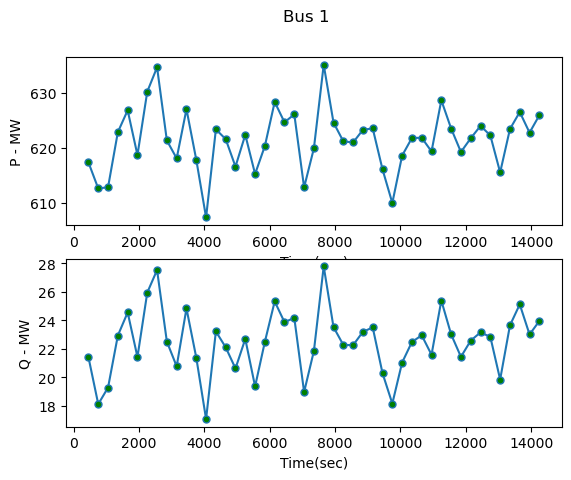

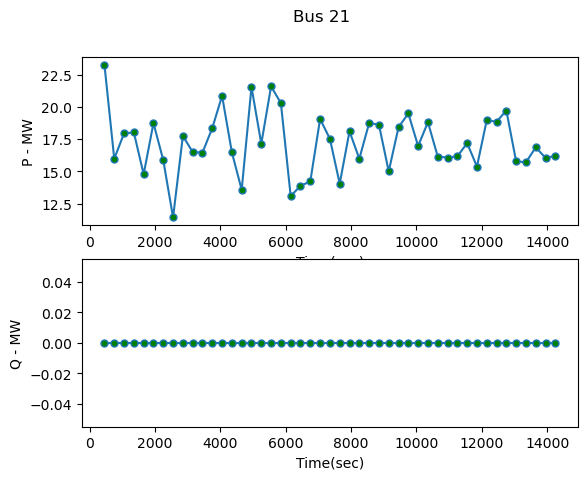

In [55]:
WecObj._psse_plot_bus(1, time)
WecObj._psse_plot_bus(21, time)

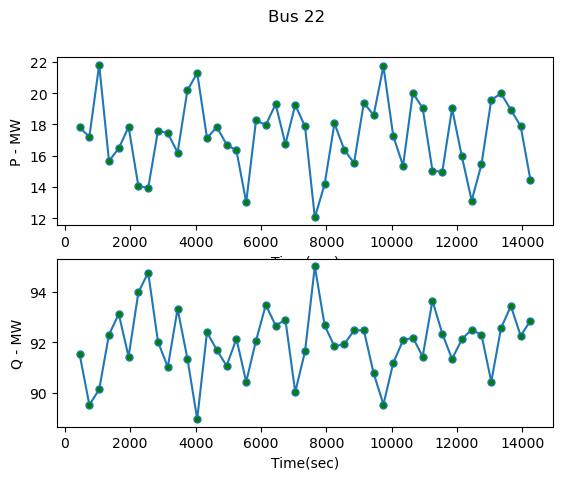

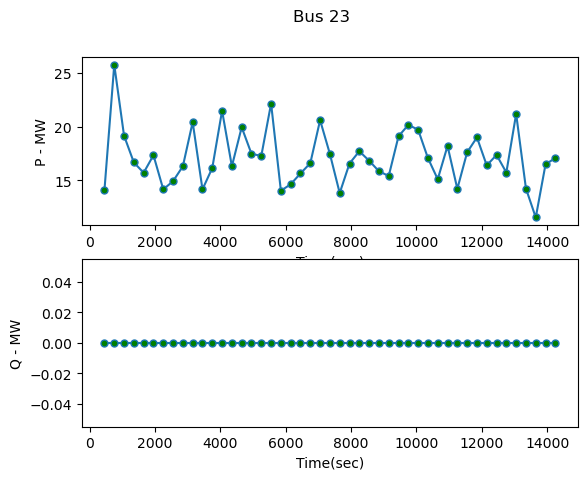

In [54]:
WecObj._psse_plot_bus(22, time)
WecObj._psse_plot_bus(23, time)

<hr style="height:4px;border-width:0;color:black;background-color:black">

<h2><center> Dynamics </center></h2>

<p style="line-height:1.5">
<span style="font-family: Times">
<span style="font-size:16pt">
Derek and I have our heads in the PSSe documentation right now figuring our how to build a .dyr for WECs. Were in the early stages on the research but ultimately would like to find a way to generate the file programmatically.
</span> 
</span>
</p>
    

In [18]:
case39 = "../input_files/ieee_39/IEEE 39 bus.RAW"
case39_dyr = r"../input_files/ieee_39/IEEE 39 bus.dyr"

In [27]:
WecObj = wg.Wec_grid(case39,[31, 32, 33])
WecObj.initalize_psse("fnsl")


 Reading IC, SBASE, REV, XFRRAT, NXFRAT, BASFRQ...

 Converting RAW data from PSS(R)E 33 to PSS(R)E 34 format
 Starting processing of Case identification data records
 Finished processing of 3 records for Case identification data
 Starting processing of Bus data records
 Finished processing of 39 records for Bus data
 Starting processing of Load data records
 Finished processing of 31 records for Load data
 Starting processing of Fixed shunt data records
 Finished processing of 2 records for Fixed shunt data
 Starting processing of Generator data records
 Finished processing of 10 records for Generator data
 Starting processing of Branch data records
 Finished processing of 34 records for Branch data
 Finished processing of 0 records for System switching device data
 Starting processing of Transformer data records
 Finished processing of 48 records for 12 Transformer data
 Starting processing of Area data records
 Finished processing of 1 records for Area data
 Starting processing of 

In [28]:
WecObj.psse_dataframe

,BUS_ID,Bus,BASE,PU,ANGLED,Type,P Gen,Q Gen,P Load,Q Load,P,Q
0,1,BUS 1,1.0,1.048980,-8.077874,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000
1,2,BUS 2,1.0,1.052789,-5.495553,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000
2,3,BUS 3,1.0,1.039262,-8.328973,1,NaN,NaN,322.000000,2.400000,-322.000000,-2.400000
3,4,BUS 4,1.0,1.022822,-9.236435,1,NaN,NaN,500.000000,184.000000,-500.000000,-184.000000
4,5,BUS 5,1.0,1.022406,-8.179247,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000
5,6,BUS 6,1.0,1.019837,-7.494417,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000
6,7,BUS 7,1.0,1.010302,-9.629506,1,NaN,NaN,233.800003,84.000000,-233.800003,-84.000000
7,8,BUS 8,1.0,1.009814,-10.116190,1,NaN,NaN,522.000000,176.000000,-522.000000,-176.000000
8,9,BUS 9,1.0,1.033909,-9.871022,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000
9,10,BUS 10,1.0,1.026927,-5.080756,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000


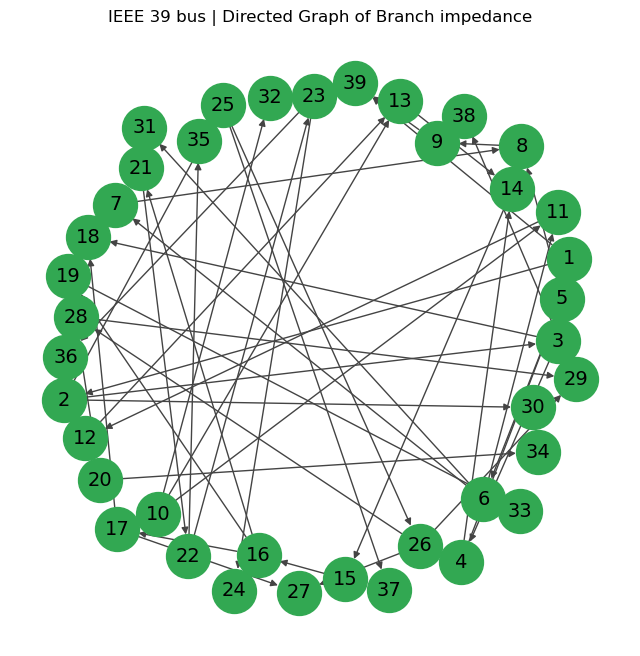

In [29]:
WecObj._psse_viz()

In [30]:
p = [wec_1.iloc[1].pg, wec_2.iloc[1].pg, wec_3.iloc[1].pg]
v = [wec_1.iloc[1].vs, wec_2.iloc[1].vs, wec_3.iloc[1].vs]
WecObj._psse_ac_injection(p, v, 'fnsl', wec_1.iloc[1].time)


 Power flow data changed for machine "1" at bus 31 [31          1.0000]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    547.058         20.4836      PG

 Power flow data changed for bus 31 [31          1.0000]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.982000         1.10000      VM

 Power flow data changed for machine "1" at bus 32 [32          1.0000]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    650.000         22.8835      PG

 Power flow data changed for bus 32 [32          1.0000]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.983000         1.10000      VM

 Power flow data changed for machine "1" at bus 33 [33          1.0000]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
    632.000         19.4330      PG

 Power flow data changed for bus 33 [33          1.0000]:
 X--ORIGINAL--X  X-NEW VALUE--X  DATA ITEM
   0.997000         1.10000      VM

  ITER       DELTAP      BUS         DELTAQ      BUS        DELTA/V/      BUS       DELTAANG      BUS
   0         7.1710(    

In [31]:
WecObj.dynamic_case_file = case39_dyr

In [33]:
WecObj._psse_run_dynamics()


 31 loads converted during this step

 31 of 31 loads converted

 Generator conversion completed using ZSORCE
 Diagonals = 39   Off-diagonals = 67   Maximum size = 92

 39 diagonal and 67 off-diagonal elements

 ITER DELTAV/TOL X----------- AT BUS -----------X  REAL(DELTAV)  IMAG(DELTAV)
    1     0.020      20     [20          1.0000]    0.1597E-06   -0.1284E-06

 Reached tolerance in 1 iterations

 Largest mismatch:     -0.00 MW      0.00 Mvar      0.00 MVA at bus 19 [19          1.0000]
 System total absolute mismatch:                    0.00 MVA

 Case saved in file c:\Users\alexb\research\WEC-GRID\input_files\ieee_39\IEEE 39 bus.sav on WED, MAR 01 2023  19:51
 Out of file data--switch to terminal input mode

 Generator models use:
  CONS         1-    140
  STATES       1-     60

 Stabilizer models use:
  CONS       141-    310
  STATES      61-    130
  VARS         1-     20
  ICONS        1-     20


 SUMMARY OF MODELS READ:

 GENS:  GENROU
          10

 STABS: IEEEST
      

In [34]:
WecObj.psse_dataframe

,BUS_ID,Bus,BASE,PU,ANGLED,Type,P Gen,Q Gen,P Load,Q Load,P,Q
0,1,BUS 1,1.0,1.048784,-32.094070,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000
1,2,BUS 2,1.0,1.049270,-31.281256,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000
2,3,BUS 3,1.0,1.027899,-34.228382,1,NaN,NaN,322.000000,2.400000,-322.000000,-2.400000
3,4,BUS 4,1.0,0.996569,-32.462635,1,NaN,NaN,500.000000,184.000000,-500.000000,-184.000000
4,5,BUS 5,1.0,0.987048,-27.981197,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000
5,6,BUS 6,1.0,0.983442,-26.552223,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000
6,7,BUS 7,1.0,0.975494,-29.311821,1,NaN,NaN,233.800003,84.000000,-233.800003,-84.000000
7,8,BUS 8,1.0,0.976149,-30.069960,1,NaN,NaN,522.000000,176.000000,-522.000000,-176.000000
8,9,BUS 9,1.0,1.019513,-31.624702,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000
9,10,BUS 10,1.0,1.002943,-29.158655,1,NaN,NaN,0.000000,0.000000,0.000000,0.000000


<hr style="height:4px;border-width:0;color:black;background-color:black">

<h2><center> Future Work </center></h2>

<ul><font size="4"> 
  <li>Finish Dynamic (sliding window)</li>
  <li>Anylisis tools</li>
  <li>GUI</li>
  <li>MatPower</li>
   <li>MiGrids</li>
</ul>

<hr style="height:4px;border-width:0;color:black;background-color:black">